# Assignment 2

### Ferenc Huszár, Nic Lane and Neil Lawrence

### 23rd February 2021

Welcome to the second assignment for the Deep Neural Networks module. In this assignment you will explore some of the model architectures we talked about in the second half of lectures.

There are 230 marks given in total for this second assessment ($\approx 70\%$ of the total of 330 marks for this course), broken into three groups:
* (A) 75 marks for the guided questions on Residual Networks
* (B) 75 marks for the guided questions on RNNs
* (C) 80 marks for a mini-project of your choice

You can choose whichever mini-project you want to attempt, we give you a range of options. If you would like to do more of these, that's fine, but will only mark one, whichever appears fist in your submitted notebook. These tasks are a bit more exploratoy, you don't have to go overboard on them. Equally, if you struggle to get them to work the way you wanted/expected, please document what you tried and what you learned.

# A: Residual Networks

In these questions we will work with residual networks (ResNets). In order to save time, we won't be training these models ourselves. Pytorch provides pre-*trained* weights for a range of commonly used models in the `torchvision` package, including ResNets of various depth. Most of the pretrained ResNets available are slightly improved versions of those proposed in 'Deep Residual Learning for Image Recognition' by [He et al (2015)](https://arxiv.org/pdf/1512.03385.pdf).

Note: you can request colab to run a GPU by going to Runtime -> Change runtime type. However, since we are only going to work with single images, it is unlikely this will buy you significant speedup.


## Setting up: Blas the border collie

To start, we will look at whether ResNets of different length can correctly classify my friend's dog Blas as a Border Collie.

In [2]:
!wget https://caballerojose.com/images/blas.jpg -P blas_the_dog/test

'wget' is not recognized as an internal or external command,
operable program or batch file.


### Loading an image

We will use the Python Imaging Library (PIL) to load the image. Colab then displays the image in-line if it is the output of the last line in the cell. Hello Blas!

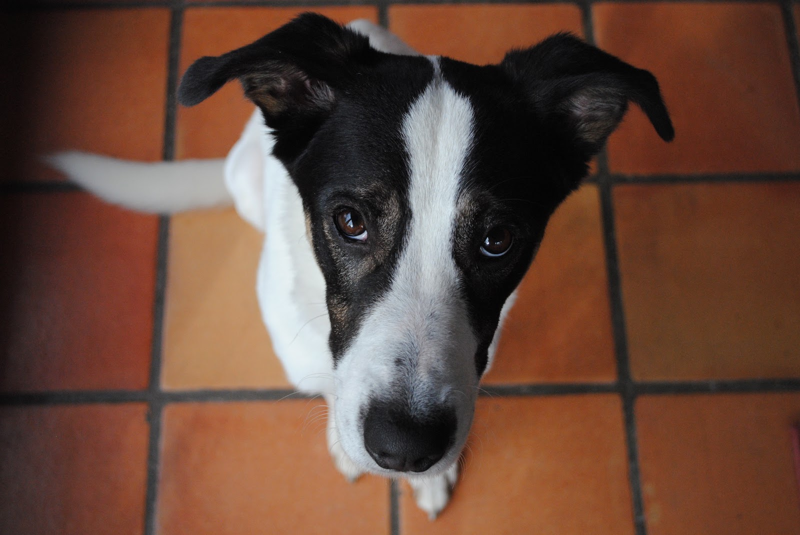

In [3]:
from PIL import Image
img = Image.open('blas_the_dog/test/blas.jpg')
img.resize((800,535))

### Transformations

ConvNets expect input images to be of a certain size, otherwise the dimensions of the tensors within the network don't work out. We have to resize this image so it is of size $224\times 224$ as the network expects. Secondly, when training neural networks, we often normalise the inputs (substract the mean and divide by the standard deviation). As this model was trained on ImageNet, we have to use the mean and standard deviation from this dataset. Thankfully, we don't have to compute this, as it's included in the [pytorch documentation](https://pytorch.org/vision/0.8/models.html) (as well as elsewhere on the internet).

We will use `transforms` from the `torchvision` module to apply these transformations to the image. We also convert from `PIL.Image` to `torch.Tensor` in the process:


In [4]:
from torchvision import transforms

transform = transforms.Compose([transforms.Resize(255),
                                transforms.CenterCrop(224),
                                transforms.ToTensor(),
                                transforms.Normalize(
                                    mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225]
                                )])

img_t = transform(img)

We can display the transformed image by converting it back to `PIL.Image`. We can see that the image was downsized, cropped to it's centre square region, and the colours are messed up due to normalization.

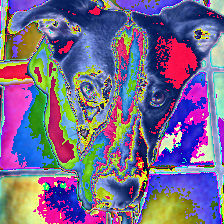

In [5]:
transforms.ToPILImage()(img_t)

### Loading  the model

Now we are going to load the pre-trained 18-layer ResNet model from the `torchvision` library.

In [6]:
from torchvision import models

resnet18 = models.resnet18(pretrained=True)

Let's see how the model classifies Blas, the border collie. For this, we have to turn the image tensor into a minibatch of 1 example, which practically means adding an extra dimension to the tensor. This can be done using the `unsqueeze` function.

In [10]:
x = img_t.unsqueeze(0)
y = resnet18(x)
y.size()

torch.Size([1, 1000])

The model's output is a vector of 1000 logits, one for each class in the ImageNet dataset. To interpret this, we have to know what the ImageNet classes are. Also, the logits themselves are less human-readable, so we are going to turn them into probabilities using a `softmax` function. This helper function below will do this for us.

In [11]:
import requests
import json
from torch.nn.functional import softmax

imagenet_labels_url = 'https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json'
response = requests.get(imagenet_labels_url)
imagenet_class_names = json.loads(response.text)

def top_5_classes(y, class_names = None):
  if class_names==None:
    imagenet_labels_url = 'https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json'
    response = requests.get(imagenet_labels_url)
    class_names = json.loads(response.text)
  p = softmax(y[0,:], dim=0)
  values, indices = p.topk(5)
  return [(class_names[index], value) for index, value in zip(indices.detach().numpy(), values.detach().numpy())]

In [102]:
top_5_classes(y)

[('bucket', 0.0078050834),
 ('plunger', 0.007231567),
 ('hook', 0.0070613003),
 ('waste container', 0.0054601976),
 ('water bottle', 0.005441311)]

Oops, the model doesn't seem to recognise Blas. It thinks Blas is a bucket, plunger or hook. This is because in order to use the pretrained models in pytorch, we have to set them to evaluation mode. When training deep neural networks, sometimes the networks work differently at training and test time. For example, when using a technique called dropout, random units in the network may be dropped at training time, but at test time, all units are used and their output is scaled. Similarly, when using batch normalisation, the network works differently in training time and at test time. To set models to evaluation mode we can use the `eval` function.

In [103]:
resnet18.eval()
y = resnet18(x)
top_5_classes(y)

[('Staffordshire Bull Terrier', 0.18592526),
 ('Cardigan Welsh Corgi', 0.13814512),
 ('American Staffordshire Terrier', 0.13022637),
 ('Basenji', 0.08973369),
 ('Whippet', 0.089418046)]

OK, getting there. At least the model now recognises Blas as a dog, but misses the specific breed. The correct class would be a Border Collie.

## Question A.1: Trying different pretrained networks

Now try different models from `torchvision` and see which ones can classify Blas correctly. In particular, check out deeper versions of ResNets. Use the [documentation](https://pytorch.org/vision/0.8/models.html) to find out what other networks are available. Use the code blocks below, and the text field to summarise what you found. (For full marks, try multiple ResNets, and at least two different non-ResNets).

*10 marks*

### Answer A.1


I first tried the selection of different ResNet depths available in Torch. As you can see, every different depth network managed to classify Blas correctly as a Border Collie, with the entire top 5 all being dogs. They had fairly similar probabilities for the target class. It's hard to say since all the ResNets classified Blas correcty, but there was no real performance improvement from the deeper networks (probability of the correct class did not increase).

Following this I tried the two wider ResNet options available. Again, these correctly predicted Border Collie, again with similar confidence, but slightly higher than the deep ResNets.

I then tried a few of the other networks Torch provides. AlexNet was successful in identifying that Blas is a dog, but failed to predict the correct breed, with Border Collie not even appearing in the top 5. Mobilenet V2 suffered a similar problem, predicting that Blas was a whippet, but at least Border Collie appeared 4th. Finally I tried ResNeXt, which performed very similarly to the rest of the ResNet networks.

In [104]:
def run_model(model, x):
    model.eval()
    y = model(x)
    print(top_5_classes(y))

# Deeper ResNets:
print("ResNet34:")
run_model(models.resnet34(pretrained=True), x)

print("ResNet50:")
run_model(models.resnet50(pretrained=True), x)

print("ResNet101:")
run_model(models.resnet101(pretrained=True), x)

print("ResNet152:")
run_model(models.resnet152(pretrained=True), x)

ResNet34:
[('Border Collie', 0.37725902), ('Australian Kelpie', 0.10201514), ('Basenji', 0.09455864), ('Whippet', 0.06443219), ('collie', 0.06039201)]
ResNet50:
[('Border Collie', 0.26172635), ('collie', 0.18037507), ('Cardigan Welsh Corgi', 0.17640837), ('Whippet', 0.12337331), ('Australian Kelpie', 0.060031377)]
ResNet101:
[('Border Collie', 0.34147304), ('Basenji', 0.23459744), ('Cardigan Welsh Corgi', 0.1752415), ('collie', 0.06757411), ('Boston Terrier', 0.026846077)]
ResNet152:
[('Border Collie', 0.36338094), ('collie', 0.29687434), ('Whippet', 0.13529693), ('Cardigan Welsh Corgi', 0.06798733), ('Australian Kelpie', 0.033542257)]


In [105]:
# Wider ResNets

print("Wide-ResNet50:")
run_model(models.wide_resnet50_2(pretrained=True), x)

print("Wide-ResNet101:")
run_model(models.wide_resnet101_2(pretrained=True), x)

Wide-ResNet50:
[('Border Collie', 0.4151427), ('Cardigan Welsh Corgi', 0.123288505), ('Whippet', 0.11470773), ('collie', 0.0917171), ('Australian Kelpie', 0.061306763)]
Wide-ResNet101:
[('Border Collie', 0.37300625), ('Whippet', 0.21933533), ('collie', 0.12068605), ('Cardigan Welsh Corgi', 0.09068453), ('Australian Kelpie', 0.044817068)]


In [106]:
# Others

print("AlexNet:")
run_model(models.alexnet(pretrained=True), x)

print("MobileNet V2:")
run_model(models.mobilenet_v2(pretrained=True), x)

print("ResNeXt50:")
run_model(models.resnext50_32x4d(pretrained=True), x)

AlexNet:
[('Whippet', 0.3551923), ('Basenji', 0.23040795), ('toy terrier', 0.1294986), ('Boston Terrier', 0.116337575), ('Italian Greyhound', 0.0794483)]
MobileNet V2:
[('Cardigan Welsh Corgi', 0.42847207), ('Whippet', 0.23701344), ('Basenji', 0.13060671), ('Border Collie', 0.0715433), ('Italian Greyhound', 0.030003408)]
ResNeXt50:
[('Border Collie', 0.3508259), ('Cardigan Welsh Corgi', 0.31425226), ('Australian Kelpie', 0.17195037), ('Basenji', 0.070983194), ('collie', 0.051720522)]


## Inspecting and modifying networks

For the next question, you will need to modify the pre-trained networks, and you will need to look inside them. Below, we share a few things that will help you learn how models work. First, let's look at what the `resnet18` architecture looks like and how that architecture is represented in pytorch. You can print the model to see a text description of it:

In [107]:
print(resnet18)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

Here, modules are listed from top to bottom in order of how they are executed.In a pytorch ResNet, residual blocks are organised into `layers`, each of which contain sequences of residual blocks. You will notice that:
* the number of channels keeps doubling at each layer, in this case from 128 -> 256 -> 512.
* at the same time, the figure size is halved with each layer. The image size is halved by `MaxPool2d` layers as well as strided convolutions where the stride is `2`.
* a `resnet18` is built out of `BasicBlock` building blocks, which are the simple residual block proposed by [He et al, (2015)](https://arxiv.org/abs/1512.03385) which I showed in the lecture. Deeper ResNets, such as `resnet50` use a more complicated `Bottleneck` component instead.
* in pytorch, the linear and nonlinear parts of a layer are separate, i.e. the convolution and subsequent ReLU activation are handled as separate layers.

To access the second convolution layer from the second residual block at the third layer, you can write the following:

In [108]:
resnet18.layer3[1].conv2

Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)

And you can access parameters of layers like so.

In [109]:
resnet18.conv1.weight.size()

torch.Size([64, 3, 7, 7])

We can visualise the convolution kernels on the first layer using the code below. In addition to showing how to access weights, you may find some of this code useful as an example of using the `matplotlib.pylab` package for plotting.

(64, 3, 7, 7)


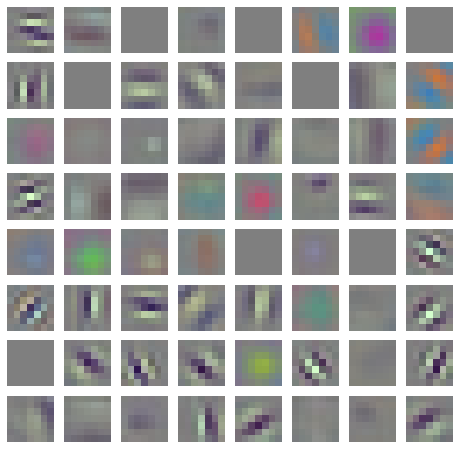

In [110]:
import numpy as np
from matplotlib import pylab as plt

f = plt.figure(figsize = (8,8))

weights = resnet18.conv1.weight.detach().numpy()
#normalising weights so a value of 0 becomes gray, and colours stay within [0,1]
weights = weights/(np.abs(weights).max())/2+0.5

#there are 64 convolution kernels, which we will arrange along an 8x8 grid
print(weights.shape)
for i, w in enumerate(weights):
  plt.subplot(8, 8, i+1)
  # we move the colour channel axis to the end, this is where imshow expects it
  plt.imshow(np.moveaxis(w, 0, -1));
  plt.axis('off')

In pytorch, you can inspect what each layer of the network does by using forward hooks. A forward hook is a python function that gets called whenever the layer is evaluated (i.e. data is passed through the layer). The forward hook function receives both the input and the output of the module. In pytorch, you can add a forward hook using the register_forward_hook function. 

For example, in the code below, I attach a hook to a layer, which simply prints something out. Instead of attaching the hook to the resnet18, I first create a `deepcopy` of the model, so the hook gets attached to the copy, but not to the `resnet18` model which I may use later.

In [111]:
import copy

def useless_hook(module, input, output):
  print('The hook was called.')

model = copy.deepcopy(resnet18)
model.layer3[1].conv2.register_forward_hook(useless_hook)
y = model(x)
y = model(x)

The hook was called.
The hook was called.


## Question A.2: Inspecting layers in neural networks

This question has a subtasks:

1. print the number of parameters in each of the operations/layers of the `ResNet18`, and count how many there are in total.

2. print the *shape of the output tensor* of the second convolution operation (`conv2`) within every single residual block in a `ResNet18`. *Tip:* you can use a forward hook.

3. Extract the activation (output) of a layer of your choice within the ResNet18, and visualise the activations using `matplotlib.pylab.imshow`. *Tip:* you can use a forward for this here, too.

4. Visualise the convolution weights (also called kernels) in the first convolution layer of a pretrained AlexNet and a VGG19 network. Compare it to what we obtained the ResNet above. Document the similarities and differences do you notice.


*Tips:*
* you can use `copy.deepcopy` to create copies of models.
* You can use `tensor.size()` to get the sape.
* you have to use `tensor.detach().numpy()` to detach a pytorch tensor from the computational graph and convert it to a numpy array.
* for plotting, you can use the `matplotlib.pylab` module. The function `imshow` can be usedd to plot activation maps as images, `axis('off')` is handy for removing axis labels. `subplot` allows you to create grids of multiple images in one figure, finally `figure(figsize=(x, y))` lets you change the overall size of the figure.
* on a pytorch module you can call `named_children` and `name_parameters` to iterate over layers and parameters, respectively.

*15 marks*

### Answer A.2

please provide your answers in code cells below (you may use multiple code cells).

In [112]:
# 1. Print the number of parameters in each of the operations/layers of the ResNet18, and count how many there are in total
import torch
resnet18 = models.resnet18(pretrained = True)

def get_total_layer_size(layer):
    size = layer.size()
    tot = 1
    for i in size:
        tot *= i
    return tot

total = 0
for name, param in resnet18.named_parameters(): # Prints any operation with parameters
    print(name,":\t", get_total_layer_size(param))
    total +=  get_total_layer_size(param)

print("\nTotal: ", total)

conv1.weight :	 9408
bn1.weight :	 64
bn1.bias :	 64
layer1.0.conv1.weight :	 36864
layer1.0.bn1.weight :	 64
layer1.0.bn1.bias :	 64
layer1.0.conv2.weight :	 36864
layer1.0.bn2.weight :	 64
layer1.0.bn2.bias :	 64
layer1.1.conv1.weight :	 36864
layer1.1.bn1.weight :	 64
layer1.1.bn1.bias :	 64
layer1.1.conv2.weight :	 36864
layer1.1.bn2.weight :	 64
layer1.1.bn2.bias :	 64
layer2.0.conv1.weight :	 73728
layer2.0.bn1.weight :	 128
layer2.0.bn1.bias :	 128
layer2.0.conv2.weight :	 147456
layer2.0.bn2.weight :	 128
layer2.0.bn2.bias :	 128
layer2.0.downsample.0.weight :	 8192
layer2.0.downsample.1.weight :	 128
layer2.0.downsample.1.bias :	 128
layer2.1.conv1.weight :	 147456
layer2.1.bn1.weight :	 128
layer2.1.bn1.bias :	 128
layer2.1.conv2.weight :	 147456
layer2.1.bn2.weight :	 128
layer2.1.bn2.bias :	 128
layer3.0.conv1.weight :	 294912
layer3.0.bn1.weight :	 256
layer3.0.bn1.bias :	 256
layer3.0.conv2.weight :	 589824
layer3.0.bn2.weight :	 256
layer3.0.bn2.bias :	 256
layer3.0.down

In [113]:
# 2. Print the shape of the output tensor of the second convolution operation (conv2) within every single residual block in a ResNet18

model = copy.deepcopy(resnet18)

def output_shape_hook(module, input, output):
  print(output.size())

for i in range(0,2):
    model.layer1[i].conv2.register_forward_hook(output_shape_hook)
    model.layer2[i].conv2.register_forward_hook(output_shape_hook)
    model.layer3[i].conv2.register_forward_hook(output_shape_hook)
    model.layer4[i].conv2.register_forward_hook(output_shape_hook)

y = model(x)

torch.Size([1, 64, 56, 56])
torch.Size([1, 64, 56, 56])
torch.Size([1, 128, 28, 28])
torch.Size([1, 128, 28, 28])
torch.Size([1, 256, 14, 14])
torch.Size([1, 256, 14, 14])
torch.Size([1, 512, 7, 7])
torch.Size([1, 512, 7, 7])


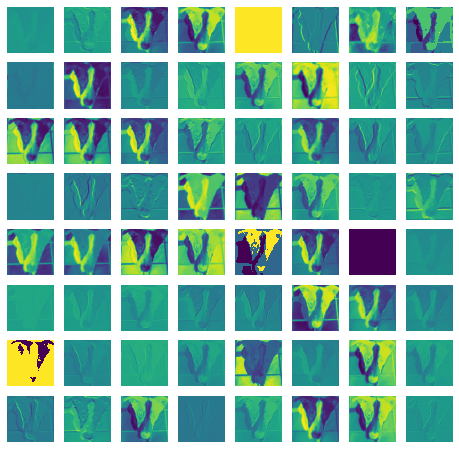

In [114]:
# 3. Extract the activation (output) of a layer of your choice within the ResNet18, and visualise the outputs using matplotlib.pylab.imshow. 

model = copy.deepcopy(resnet18)

f = plt.figure(figsize = (8,8))


outputs = None
def output_hook(module, input, output):
    global outputs
    outputs = output.detach().numpy()

model.conv1.register_forward_hook(output_hook)
y = model(x)
#normalising weights so a value of 0 becomes gray, and colours stay within [0,1]
outputs = outputs/(np.abs(outputs).max())/2+0.5


#there are 64 convolution kernels, which we will arrange along an 8x8 grid
for i, o in enumerate(np.moveaxis(outputs,0,-1)):
  plt.subplot(8, 8, i+1)
 
  # we move the colour channel axis to the end, this is where imshow expects it
  plt.imshow(o);
  plt.axis('off')


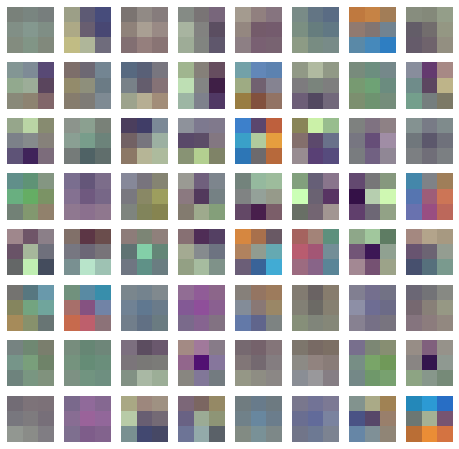

In [115]:
# 4. Visualise the convolution weights (also called kernels) in the first convolution layer of a pretrained AlexNet and a VGG19 network. Compare it to what we obtained the ResNet above. Document the similarities and differences do you notice.

vgg = models.vgg19(pretrained=True)

yv = vgg(x)

f = plt.figure(figsize = (8,8))

vgg_weights = vgg.features[0].weight.detach().numpy()

#normalising weights so a value of 0 becomes gray, and colours stay within [0,1]
vgg_weights = vgg_weights/(np.abs(vgg_weights).max())/2+0.5

#there are 64 convolution kernels, which we will arrange along an 8x8 grid
for i, w in enumerate(vgg_weights):
  plt.subplot(8, 8, i+1)
  # we move the colour channel axis to the end, this is where imshow expects it
  plt.imshow(np.moveaxis(w, 0, -1));
  plt.axis('off')

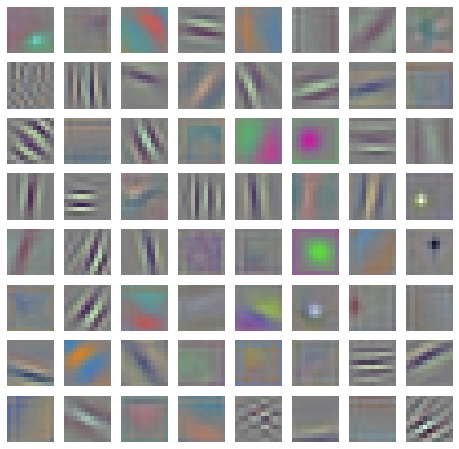

In [116]:
alex = models.alexnet(pretrained=True)
ya = alex(x)

f = plt.figure(figsize = (8,8))

alex_weights = alex.features[0].weight.detach().numpy()

#normalising weights so a value of 0 becomes gray, and colours stay within [0,1]
alex_weights = alex_weights/(np.abs(alex_weights).max())/2+0.5

#there are 64 convolution kernels, which we will arrange along an 8x8 grid
for i, w in enumerate(alex_weights):
  plt.subplot(8, 8, i+1)
  # we move the colour channel axis to the end, this is where imshow expects it
  plt.imshow(np.moveaxis(w, 0, -1));
  plt.axis('off')

In [117]:
print("Alexnet weight shapes: ",alex_weights.shape)
print("VGG: ", vgg_weights.shape)
print("ResNet :", weights.shape)

Alexnet weight shapes:  (64, 3, 11, 11)
VGG:  (64, 3, 3, 3)
ResNet : (64, 3, 7, 7)


We can see here that each different network has weight vectors of varying shape. Each has the same number of channels, and same total number of weights, but the weights themselves vary in size from AlexNet's 11x11, VGG's 3x3 and ResNet's 7x7.

In terms of the values of these vectors, it is hard to draw any meaningful conclusion as to what they do. We see a few with line patterns at different angles, so we could guess that they are looking for edges at a certain orientation. These are visible in all three plots. Also, we see a lot of the purple and pale yellow/green combination, so this could be looking for edges of a certain colour combination.

## Editing models

Models can be edited rather flexibly in pytorch. Underlying a pytorch `Module` are python `OrderedDict` objects. These are ordered lists of key-value pairs. Each submodule and each parameter has a name, which is the key. Members of the dictionay can be accessed as attributes of the `Module`. Adding a new parameter or layer to a module will add a new key-value pair to this dictionary.

Let's try adding a new operation to our resnet18, which converts the logits to probabilities. We will do this by replacing the final operation by a `Sequential` module, which chains multiple operations together.

In [118]:
from torch.nn import Softmax, Sequential

model = copy.deepcopy(resnet18)
model.fc = Sequential(
    model.fc,
    Softmax(dim=1)
    )

In [119]:
#let's see what the model looks like now
print(model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

Let's check the model still works and that it outputs a vector of probabilities which therefore sums to one.

In [120]:
y = model(x)
print(y.sum())

tensor(1., grad_fn=<SumBackward0>)


We can also replace existing layers with other layers. Here, for example, I replace the first convolution layer with a randomly initialized one of the same dimensions. We can check what effect this has on the classification of Blas:

In [12]:
from torch.nn import Conv2d

model = copy.deepcopy(resnet18)
model.conv1 = Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
y = model(x)
top_5_classes(y)

[('bucket', 0.007829665),
 ('hook', 0.006851346),
 ('waste container', 0.0066137123),
 ('plunger', 0.006479291),
 ('water bottle', 0.0056344643)]

Or, if we replace the convolutional layer by the convolutions from the VGG19 network, followed by a MaxPooling, to account for the difference in stride, the network becomes pretty certain that Blas is, in fact, spider web, or possibly a type of spider.

In [122]:
from torch.nn import MaxPool2d

vgg19 = models.vgg19(pretrained=True)

model = copy.deepcopy(resnet18)
model.conv1 = Sequential(
      vgg19.features[0],
      MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False))
y=model(x)
top_5_classes(y)

[('bucket', 0.009255356),
 ('waste container', 0.006650836),
 ('hook', 0.0061662477),
 ('plunger', 0.006152281),
 ('water jug', 0.0055529396)]

## Question A.3: Dropping layers in ResNet15

This question is composed of several tasks:

1. Delete the second `BasicBlock` from `layer4` of the ResNet18, and see how the network's predictions change. 

1. Delete the first `BasicBlock` from `layer4` of the ResNet18, and see how the network's predictions change. (Note, this is a bit morer involved than the previous one).

1. Delete the first `BasicBlock` from `layer2` of the ResNet18, and see how the network's predictions change.

Tips:
* There are several ways for removing a ResNet block:
  * The easiest perhaps is to replace the entire block with a `torch.nn.Identity`. This works for blocks where the output and input featuremap size are the same. However, some of the residual blocks also reduce the size of the image (strided convolutions, or Max Pooling), so replacing by the Identity won't work. This is why the second task is a bit harder than the first. To find out what you have to do in the second task, look closely at the difference between the two `BasicBlock` instances within `layer4`. To understand how this block works, you can also look at the [source code](https://github.com/pytorch/vision/blob/master/torchvision/models/resnet.py#L67).
  * Since the activations are all ReLU, you can also ignore the effect of layers by setting appropriate weights and biases to zero. This is because $\operatorname{ReLU}(0z).= 0$. However, if you are trying to use this method, be aware of batch normalization layers - you also want to remove the effect of those.
  * You will notice that the layers of ResNets are of `torch.nn.Sequential` type. You can drop an element from this by creating a new `Sequential` instead with one operation removed.
* You can solve this task using a few lines of code only.

*15 marks*

### Answers A.3

Please provide your answer in the code blocks below.

In [123]:
#1. dropping layer4 second block
import copy
model = copy.deepcopy(resnet18)
model.layer4[1] = torch.nn.Identity()
model.eval()
y=model(x)
print(top_5_classes(y))


[('Italian Greyhound', 0.0017483454), ('Basenji', 0.0017345111), ('Boston Terrier', 0.0017241775), ('space heater', 0.001647308), ('Appenzeller Sennenhund', 0.0016333456)]


Here I simply switch out the layer for the identity. We see that the dog breed prediction has changed and the correct class is not in the top 5, but it still identifies Blas as a dog.

In [15]:
#2. dropping layer4 first block
# Problem comes from first conv2d in this block - input channels (256) do not equal output channels (512)
import copy,torch
model = copy.deepcopy(resnet18)

conv = Conv2d(256, 512, kernel_size=(1,1), stride=(2,2), bias=False)
torch.nn.init.dirac_(conv.weight) # equivalent to setting all weights to zero

model.layer4[0] = conv

model.eval()
y = model(x)
print(top_5_classes(y))


[('bottle cap', 0.040522315), ('beer glass', 0.030364735), ('chain', 0.026167277), ('trombone', 0.024571288), ('football helmet', 0.023797555)]


This block has had a much larger effect on the classification, as we now get a list of inanimate objects. 

In [125]:
#2. dropping layer2 first block

model = copy.deepcopy(resnet18)
conv = Conv2d(64, 128, kernel_size=(1,1), stride=(2,2), bias=False)
torch.nn.init.dirac_(conv.weight) # equivalent to setting all weights to zero
model.layer2[0] = conv

model.eval()
y = model(x)
print(top_5_classes(y))


[('window screen', 0.5506717), ('window shade', 0.19037966), ('spider web', 0.071330376), ('shower curtain', 0.05384813), ('solar thermal collector', 0.022039685)]


Again, replacing a downsampling block has had a significant effect. I theorise that this is because when it downsamples, it picks a specfic set of pixels to continue to the next phase.

## A convenience function: flattening ResNets

Residual blocks in pytorch ResNets are organised into 4 layers. I found this rather cumbersome for the next exercise we are going to do. In order to make ResNets easier to work with I created the convenience function below which can *flatten* the layer hierarchy of pytorch resnet models, merging the 4 layers into one, called `residual_blocks`. After flattening, instead of accessing `model.layer1[0]` you can do `model.residual_blocks[0]`.

In [126]:
from torch import nn
from collections import OrderedDict

def flatten_resnet(resnet_model):
  """
  Takes a pytorch resnet model and returns a copy of the same model in a 
  flattened format, where the residulal blocks are not divided into four layers
  but are instead all in a residual blocks component.
  """
  model = copy.deepcopy(resnet_model)
  residual_blocks = nn.Sequential(*model.layer1,
                *model.layer2,
                *model.layer3,
                *model.layer4)
  return nn.Sequential(OrderedDict([
     ('conv1', model.conv1),
     ('bn1', model.bn1),
     ('relu', model.relu),
     ('maxpool', model.maxpool),
     ('residual_blocks', residual_blocks),
     ('avgpool', model.avgpool),
     ('flatten', nn.Flatten()),
     ('fc', model.fc)
  ]))

## Question A.4: Dropping layers in ResNet50

Load a pretrained ResNet50, and evaluate the model's predictions on the photo of Blas. Does it get the breed correct? (Border Collie).

Look at the structure of the ResNet50. Identify the `Bottleneck` blocks which are used instead of `BasicBlock` building blocks in deeper ResNets. These are still arranged into 4 'layers', and there are 16 of them in total.

Drop each of the 16 `Bottleneck` blocks from the ResNet50 (one at a time, not all at once), and make predictions with each of the perturbed networks. Plot the predicted probability of the Border Collie class (ImageNet class number 232) as a function of the index of the layer dropped. Compare the probabilities you get with the probability for the unperturbed model. What do you see?

*20 marks*

### Answers A.4

Text in code cells below graphs, so it is easier to refer to them while reading.


In [127]:
# Evaluate
resnet50 = models.resnet50(pretrained=True)
print(run_model(resnet50, x))

[('Border Collie', 0.26172635), ('collie', 0.18037507), ('Cardigan Welsh Corgi', 0.17640837), ('Whippet', 0.12337331), ('Australian Kelpie', 0.060031377)]
None


Correct!

In [128]:
# Inspect
resnet50

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [188]:
# Prob of unperturbed

model = copy.deepcopy(flat_resnet50)
model.eval()
y = model(x)
p = softmax(y[0,:], dim=0) 
unperturbed =  p[232].detach().numpy()

temp = torch.argsort(p, descending = True)
p_ranks = torch.argsort(temp)
u_rank = p_ranks[232]
print("Unperturbed probability: ", unperturbed)
print("Rank: ", u_rank.numpy()) #0 is top

Unperturbed probability:  0.26172635
Rank:  0


In [177]:
# Flatten to make dropping easier
flat_resnet50 = flatten_resnet(models.resnet50(pretrained=True))

bc_probs = np.zeros(16)
ranks = np.zeros(16)
indices = np.arange(0,16)
for i in range(0,16):
    model = copy.deepcopy(flat_resnet50)

    if(i == 0):
        conv = Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        torch.nn.init.dirac_(conv.weight)
        model.residual_blocks[i] = conv
        
    elif(i == 3):
        conv = Conv2d(256, 512, kernel_size=(1, 1), stride=(2, 2), bias=False)
        torch.nn.init.dirac_(conv.weight)
        model.residual_blocks[i] = conv
    elif(i == 7):
        
        conv = Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
        torch.nn.init.dirac_(conv.weight)
        model.residual_blocks[i] = conv
    elif(i == 13):
        conv = Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
        torch.nn.init.dirac_(conv.weight)
        model.residual_blocks[i] = conv
    else:
        model.residual_blocks[i] = torch.nn.Identity()


    model.eval()
    y = model(x)
    p = softmax(y[0,:], dim=0) 
    bc_probs[i] = p[232].detach().numpy() 
    temp = torch.argsort(p, descending = True)
    p_ranks = torch.argsort(temp)
    ranks[i] = p_ranks[232]


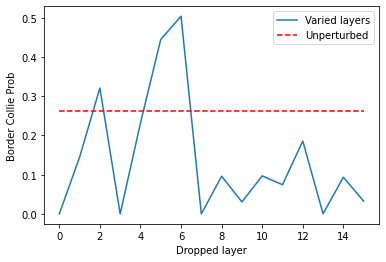

In [176]:
unperturbeds = np.empty_like(bc_probs)

unperturbeds.fill(unperturbed)

plt.plot(indices, bc_probs, label= 'Varied layers')
plt.plot(indices, unperturbeds, color='red', linestyle='--', label='Unperturbed')
plt.legend()
plt.xlabel('Dropped layer')
plt.ylabel('Border Collie Prob')
plt.show()

We see significantly varying results when we drop each layer. Some layers, such as 0, 7 and 13, appear critical to the function of the network, as when we replace them with an identity convolution they reduce the probability of Border Collie to zero. However, removing some other layers actually increased the probability of the Border Collie class against the baseline, such as 2, 5 and 6. I hypothesise that this is either a. increasing the probability of all classes, so not useful, or b. may not generalise to many images, rather than the network being poorly designed. 

I test my first hypothesis below, by plotting the rank of Border Collie:


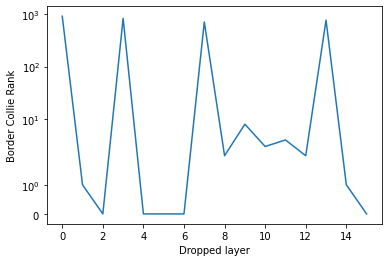

In [194]:
plt.plot(indices, ranks, label= 'Varied layers')
plt.xlabel('Dropped layer')
plt.yscale('symlog')
plt.ylabel('Border Collie Rank')
plt.show()


See that as expected, whenever the probability is zero, the rank skyrockets.

However the higher probabilities around 2, 5 and 6 do still give Border Collie the highest rank. Perhaps also suprisingly, dropping the final layer also gave it a very high rank.

## Question A.5: Permuting and Repeating Layers

Now, let's see what happens if we permute or repeat layers in the ResNet.

1. Permute layers: Swap `resnet50.layer2[1]` and `resnet50.layer2[3]` in the network (so that instead of the second `Bottleneck` unit in `layer2` you use the fourth and vice versa). Make predictions with the modified network. How did perturbing the model this way modify the predictions?
1. Repeat a residual block in the ResNet. Apply the second `Bottleneck` block of `layer2` of the ResNet twice instead of just once, making the model deeper. Make predictions with the modified model. What do you find?
1. Now repeat the layer 2, 3, 4, 5 times. Do the predictions keep improving?

*15 marks*

### Answers A.5

We see that after the permute, Border Collie is still the highest rank, but with even  higher confidence.

After a single repeat, it is bumped to second by a Corgi class, but ultimately it still recognises Blas as a dog.

As I added more repeats, performance got worse. After just one more repeat, no dog class appeared in the top 5. After 4 repeats it was very confident that Blas was a slot machine.

This result is interesting because it shows us that just aimlessly making our networks deeper does not necessarily mean endless improvements.

In [131]:
# 1. Permute
model = copy.deepcopy(resnet50)
temp = model.layer2[1]
model.layer2[1] = model.layer2[3] 
model.layer2[3] = temp
run_model(model, x)

[('Border Collie', 0.526403), ('collie', 0.19437501), ('Cardigan Welsh Corgi', 0.12707636), ('Australian Kelpie', 0.09079478), ('tennis ball', 0.009583718)]


In [132]:
# 2. Repeat
model = copy.deepcopy(resnet50)
repeat = model.layer2[1]
new_layer = nn.Sequential(
    model.layer2[0],
    model.layer2[1],
    model.layer2[1],
    model.layer2[2],
    model.layer2[3]
)
model.layer2 = new_layer
run_model(model, x)

[('Cardigan Welsh Corgi', 0.31549332), ('Border Collie', 0.31035155), ('collie', 0.11772069), ('Australian Kelpie', 0.0927907), ('Basenji', 0.03330337)]


In [133]:
#3. Repeat

new_layer = nn.Sequential(
    model.layer2[0],
    model.layer2[1],
    model.layer2[1],
    model.layer2[1],
    model.layer2[2],
    model.layer2[3]
)
print("2 repeats:")
model.layer2 = new_layer
run_model(model, x)

new_layer = nn.Sequential(
    model.layer2[0],
    model.layer2[1],
    model.layer2[1],
    model.layer2[1],
    model.layer2[1],
    model.layer2[2],
    model.layer2[3]
)
print("3 repeats:")
model.layer2 = new_layer
run_model(model, x)

new_layer = nn.Sequential(
    model.layer2[0],
    model.layer2[1],
    model.layer2[1],
    model.layer2[1],
    model.layer2[1],
    model.layer2[1],
    model.layer2[2],
    model.layer2[3]
)
print("4 repeats:")
model.layer2 = new_layer
run_model(model, x)

2 repeats:
[('sea slug', 0.3818408), ('slot machine', 0.14123152), ('goldfish', 0.050420966), ('Windsor tie', 0.034080956), ('honeycomb', 0.019382775)]
3 repeats:
[('sock', 0.3323224), ('tripod', 0.2057573), ('lighter', 0.09386698), ('slot machine', 0.08708217), ('maze', 0.038379073)]
4 repeats:
[('slot machine', 0.79474056), ('tripod', 0.14320037), ('analog clock', 0.014699518), ('whistle', 0.008504549), ('dishwasher', 0.0051930724)]


# B: Recurrent Networks

In this part of the assignment, we will train simple recurrent networks to detect messages hidden in binary strings.

## Backgroud

### Creating the dataset

Below, I included a function which creates a pytorch `Dataset` we will use in the questions below. 


In [134]:
import torch
import numpy as np
from torch.utils.data import TensorDataset, DataLoader

def get_binary_dataset(num_datapoints, signature_length=20, random_length=20):
  '''
  Creates a labelled dataset of `num_datapoints` binary sequences. Each sequence
  is of total length `signature_length + random_length`. Positive examples have
  a signature string of length `signature_length` embedded starting at a random
  location within the string. The signature is a binary string of alternating 1s
  and 0s. Negative examples are random bitstrings. They may contain the
  signature by chance, although the probability of this diminishes as the
  `signature_legth` increases.

  The returned dataset contains positive examples first, followed by negatives.
  When using minibatch-SGD, the dataset has to be shuffled before broken into
  minibatches.
 
  Attributes
  ----------
  num_datapoints : int
    Number of datapoints to be generated. Half of the datapoints will be
    positive, the rest negative. If `num_datapoints==1` then the dataset will
    contain a single positive example.
  signature_length : int
    Length of the signature string
  random_length : int
    Number of random bits in the sequence in addition to the signature sequence.
  
  Returns
  -------
  torch.utils.data.TensorDataset
    Pytorch dataset containing the strings and their binary labels.
  '''
  num_positives = num_datapoints - num_datapoints // 2
  y = np.array([[1.0]]*num_positives + [[0.0]]*(num_datapoints - num_positives))
  X = np.random.randint(2, size=(num_datapoints, signature_length + random_length))
  signature = np.array((signature_length//2)*[1.0, 0.0])
  for i in range(num_positives):
    j = np.random.randint(random_length)
    X[i, j:(j+signature_length)] = signature
  X = torch.tensor(X, dtype=torch.float)[:, :, None]
  y = torch.tensor(y)
  return TensorDataset(X, y)


Below, I visualise a dataset of $100$ positive and $100$ negative sequences of lenth $40$ each. In the visualisation below, positive examples appear on top, negatives in the bottom half. Black pixels show $1$s, white pixels show $0$s. You can see the signature sequence `10101010101010101010` embedded in the positive examples at random locations.

*Notes:* You can see how I used `spy` to visualise a sparse matrix. This function can be used to show non-zero values in a matrix. The pytorch `TensorsDataset` object has a `tensors` attribute which contains the input and output tensors.

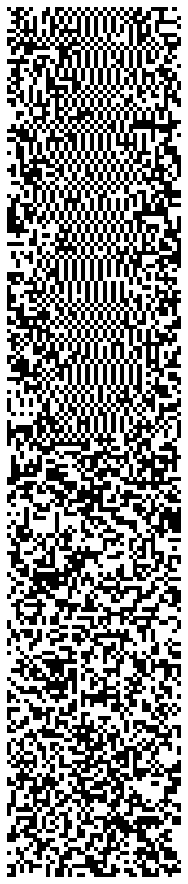

In [135]:
from matplotlib import pylab as plt

ds = get_binary_dataset(200, signature_length=20, random_length=20)

plt.figure(figsize=(4, 16))
plt.spy(ds.tensors[0][:, :, 0].numpy())
plt.axis('off');

## Building a classifier

Now we're going to build a simple RNN-based classifier for classifying binary sequences. We are going to feed the sequence into an RNN, then extract the hidden state activations at the end of the sequence, finally apply a linear transformation to calculate the classifier output.

An RNN module returns two outputs, as explained in [the documentation](https://pytorch.org/docs/stable/generated/torch.nn.RNN.html). We have to select a layer which selects the second output - which is the activation of the hidden state at the end of the sequence - rearranges and flattens it so it's ready to be fed into a linear layer.

*Note:* By applying a further `sigmoid`, this classifier output can be turned into a probability, like it was the case with `softmax` the ResNet example. We are not going to make the sigmoid part of the network, as training will be more numerically stable this way

In [136]:
class extract_last_cell(nn.Module):
  '''Pytorch module which extracts and flattens the last hidden state of an RNN.
  '''
  def forward(self,x):
    _ , out = x
    return out.permute(1,0,2).flatten(start_dim=1)

def get_basic_RNN_classifier():
  return nn.Sequential(
    nn.RNN(input_size=1, hidden_size=20, num_layers=2, batch_first=True),
    extract_last_cell(),
    nn.Linear(in_features = 20*2, out_features=1)
  )

## Question B.1: Evaluating the loss

Evaluate the log-loss of a randomly initialized classifier on minibatches of training examples from the dataset we defined before.

*Tips:*
* you can use [`pytorch/utils.data.DataLoader`](https://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader) to sample minibatches of training data from the dataset
* or, you can also access the input and output tensors of a `TensorDataset` directly via the `tensors` attribute
* use [`torch.nn.BCEWithLogitsLoss`](https://pytorch.org/docs/stable/generated/torch.nn.BCEWithLogitsLoss.html) or [`torch.nn.functional.binary_cross_entropy_with_logits`](https://pytorch.org/docs/stable/nn.functional.html)

*10 marks*

### Answer B.1

please add answer in the code cell(s) below:

In [197]:
# Classifier 
rnn = get_basic_RNN_classifier()


loader = torch.utils.data.DataLoader(ds, batch_size=16, shuffle=True)
logloss = torch.nn.BCEWithLogitsLoss()

i = 0
tot = 0
for X,Y in loader:
    y = rnn(X)
    print("Batch " + str(i) + " log-loss: " + str(logloss(y, Y).detach().numpy()))
    i+=1
    tot+=logloss(y, Y).detach().numpy()
print("\nMean Loss: ",tot/13)


Batch 0 log-loss: 0.6972527974285185
Batch 1 log-loss: 0.6808355422690511
Batch 2 log-loss: 0.698636528570205
Batch 3 log-loss: 0.6948256245814264
Batch 4 log-loss: 0.7064399789087474
Batch 5 log-loss: 0.6934748878702521
Batch 6 log-loss: 0.7005070270970464
Batch 7 log-loss: 0.6963725760579109
Batch 8 log-loss: 0.6985080363228917
Batch 9 log-loss: 0.6946423295885324
Batch 10 log-loss: 0.6947971363551915
Batch 11 log-loss: 0.6854417296126485
Batch 12 log-loss: 0.6739365952089429

Mean Loss:  0.6935131376824126


## Training the classifier

In the previous assignment we wrote a training loop to show how optimizers work in pytorch. For this assignment we are going to use ignite, a flexible module for reusable training loops in pytorch. We will install ignite, and then I provide a function you can use to train models on the sequence data.

In [139]:
!pip install pytorch-ignite

You should consider upgrading via the 'c:\users\joest\appdata\local\programs\python\python38\python.exe -m pip install --upgrade pip' command.


In [140]:
from ignite.engine import Events, create_supervised_trainer, create_supervised_evaluator
from ignite.metrics import Accuracy, Loss

def fit_model_basic(model, training_dataset, test_dataset):
  '''Fits a pytorch model to the training dataset using stochastic gradient
  descent and tracks progress on a test set.

  Arguments
  ---------
  model : pytorch.nn.Module
    pytorch model that can be evaluated on input tensor in the dataset, and
    returns a tensor that matches the shape of the output tensor.
  training_dataset : pytorch.util.data.Dataset
    used to train the model
  test_dataset : pytorch.util.data.Dataset
    used to evaluate the performance of the model at the end of each epoch

  Retuns
  ------
  pytorch.nn.Module
    the model after training
  '''

  train_loader = DataLoader(
      training_dataset,
      batch_size=100,
      shuffle=True
  )
  val_loader = DataLoader(
      test_dataset,
      batch_size=1000,
      shuffle=False,
  )

  optimizer = torch.optim.SGD(model.parameters(), lr=0.1)
  criterion = nn.BCEWithLogitsLoss()

  trainer = create_supervised_trainer(model, optimizer, criterion)

  def thresholded_output_transform(output):
      y_pred, y = output
      y_pred = torch.heaviside(y_pred, values=torch.zeros(1))
      return y_pred, y

  val_metrics = {
      "accuracy": Accuracy(thresholded_output_transform),
      "bce": Loss(criterion)
  }
  evaluator = create_supervised_evaluator(model, metrics=val_metrics)

  @trainer.on(Events.ITERATION_COMPLETED(every=10))
  def log_training_loss(trainer):
      print(f"Epoch[{trainer.state.epoch}] Loss: {trainer.state.output:.2f}")

  @trainer.on(Events.EPOCH_COMPLETED)
  def log_training_results(trainer):
      evaluator.run(train_loader)
      metrics = evaluator.state.metrics
      print(f"Training Results - Epoch: {trainer.state.epoch}  Avg accuracy: {metrics['accuracy']:.2f} Avg loss: {metrics['bce']:.2f}")

  @trainer.on(Events.EPOCH_COMPLETED)
  def log_validation_results(trainer):
      evaluator.run(val_loader)
      metrics = evaluator.state.metrics
      print(f"Validation Results - Epoch: {trainer.state.epoch}  Avg accuracy: {metrics['accuracy']:.2f} Avg loss: {metrics['bce']:.2f}")

  trainer.run(train_loader, max_epochs=5)

  return model

The code above looks rather long and complicated, but that is because we ask ignite to log the progress of training in a very verbose way. Ignite uses python decorators (like the `@trainer.on(Events.EPOCH_COMPLETED)`) bits. You will find plenty of tutorials online if you google 'python decorators' if you want to learn more about them. In ignite, these decorators are used to register functions which are called when various events happen during training.

For example, `@trainer.on(Events.ITERATION_COMPLETED(every=10))` tells ignite to execute the function that's below it every 10th iteration is completed. You will find that this training loop is largely a copy of the example code provided in the [ignite master documentation](https://pytorch.org/ignite/quickstart.html#code).

One difference is that we use the `thresholded_output_transform` to transform the network's output before [`Accuracy`](https://pytorch.org/ignite/metrics.html#ignite.metrics.Accuracy) metric can be evaluated. Accuracy compares binary predictions to binary labels. But our network outputs `logits` instead of binary predictors. To turn these into binary decisions, we have to determine whether the logits are above or below $0$, which is what the `heaviside` function does.

Ignite can do much more than what we ask it to do here. It's a flexible way of creating reproducible training loops for neural network training. It can handle distributed training over several machines, etc.

Let's now use our training loop to train a classifier on the binary dataset we created:

In [141]:
ds_train = get_binary_dataset(5000, signature_length=10, random_length=10)
ds_test = get_binary_dataset(1000, signature_length=10, random_length=10)
rnn_classifier = get_basic_RNN_classifier()

fit_model_basic(rnn_classifier, ds_train, ds_test)

Epoch[1] Loss: 0.70
Epoch[1] Loss: 0.69
Epoch[1] Loss: 0.69
Epoch[1] Loss: 0.69
Epoch[1] Loss: 0.69
Training Results - Epoch: 1  Avg accuracy: 0.50 Avg loss: 0.69
Validation Results - Epoch: 1  Avg accuracy: 0.50 Avg loss: 0.69
Epoch[2] Loss: 0.69
Epoch[2] Loss: 0.70
Epoch[2] Loss: 0.69
Epoch[2] Loss: 0.69
Epoch[2] Loss: 0.69
Training Results - Epoch: 2  Avg accuracy: 0.50 Avg loss: 0.69
Validation Results - Epoch: 2  Avg accuracy: 0.50 Avg loss: 0.69
Epoch[3] Loss: 0.69
Epoch[3] Loss: 0.69
Epoch[3] Loss: 0.69
Epoch[3] Loss: 0.69
Epoch[3] Loss: 0.69
Training Results - Epoch: 3  Avg accuracy: 0.51 Avg loss: 0.69
Validation Results - Epoch: 3  Avg accuracy: 0.50 Avg loss: 0.69
Epoch[4] Loss: 0.69
Epoch[4] Loss: 0.69
Epoch[4] Loss: 0.69
Epoch[4] Loss: 0.69
Epoch[4] Loss: 0.70
Training Results - Epoch: 4  Avg accuracy: 0.52 Avg loss: 0.69
Validation Results - Epoch: 4  Avg accuracy: 0.53 Avg loss: 0.69
Epoch[5] Loss: 0.69
Epoch[5] Loss: 0.69
Epoch[5] Loss: 0.69
Epoch[5] Loss: 0.69
Epoch[5]

Sequential(
  (0): RNN(1, 20, num_layers=2, batch_first=True)
  (1): extract_last_cell()
  (2): Linear(in_features=40, out_features=1, bias=True)
)

Oh no! The error doesn't seem like the loss is reduced. Let's try to fix this.



## Question B.2: Improving the SGD code

1. Create a new version of `fit_model_basic` function, call it `fit_model`. You will use this function in subsequent questions. Your function should take additional arguments allowing you to easily specify key hyperparameters of optimization: learning rate, batchsize, whatever else you find important.
1. Tune hyperparameters and change things until training works reliably. Consider [changing the optimizer](https://pytorch.org/docs/stable/optim.html) from vanilla SGD: you may try SGD with momentum, `Adam`, etc. You should be able to make this example work, i.e. reach $90\%+$ average accuarcy within a few seconds of training.

*Tips*:
 * You can try different learning rates, such as the [Karpathy constant](https://twitter.com/karpathy/status/801621764144971776). This is a joke, learning rates are usually problem-specific. Values between $0.1$ and $0.001$ are often tried.
 * If you want, you can run grid search: running training for different values of hyperparameters, and checkind which one produces the best results. If doing so, consider spacing parameter values logarithmically rather than linearly. I.e. it makes more sense to try learning rates $[0.001, 0.01, 0.1]$ than to try $[0.001, 0.002, 0.003, \ldots]$.

*15 marks*

### Answer B.2

The changes I made were mostly to add the hyperparameters/optimiser as parameters to the fit_model function. This allows me to run a grid-search over different combinations of parameters to find which performs the best.

As you will see in later code cells, this was used to great effect and the accuracy/loss were greatly improved by changing these hyperparameters.

In [142]:
from ignite.engine import Events, create_supervised_trainer, create_supervised_evaluator
from ignite.metrics import Accuracy, Loss

def fit_model(model, training_dataset, test_dataset, lr, bs, opt, epochs):

  '''Fits a pytorch model to the training dataset using stochastic gradient
  descent and tracks progress on a test set.

  Arguments
  ---------
  model : pytorch.nn.Module
    pytorch model that can be evaluated on input tensor in the dataset, and
    returns a tensor that matches the shape of the output tensor.
  training_dataset : pytorch.util.data.Dataset
    used to train the model
  test_dataset : pytorch.util.data.Dataset
    used to evaluate the performance of the model at the end of each epoch

  Retuns
  ------
  pytorch.nn.Module
    the model after training
  '''

  train_loader = DataLoader(
      training_dataset,
      batch_size=bs,
      shuffle=True
  )
  val_loader = DataLoader(
      test_dataset,
      batch_size=1000,
      shuffle=False,
  )

  if (opt == 'vanilla'):
    optimizer = torch.optim.SGD(model.parameters(), lr=lr)
  elif (opt == 'adam'):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
  elif (opt == 'adagrad'):
    optimizer = torch.optim.Adagrad(model.parameters(), lr=lr)

  criterion = nn.BCEWithLogitsLoss()

  trainer = create_supervised_trainer(model, optimizer, criterion)

  def thresholded_output_transform(output):
      y_pred, y = output
      y_pred = torch.heaviside(y_pred, values=torch.zeros(1))
      return y_pred, y

  val_metrics = {
      "accuracy": Accuracy(thresholded_output_transform),
      "bce": Loss(criterion)
  }

  evaluator = create_supervised_evaluator(model, metrics=val_metrics)

  #@trainer.on(Events.ITERATION_COMPLETED(every=10))  Reduce output size
  def log_training_loss(trainer):
      print(f"Epoch[{trainer.state.epoch}] Loss: {trainer.state.output:.2f}")

  @trainer.on(Events.COMPLETED)
  def log_training_results(trainer):
      evaluator.run(train_loader)
      metrics = evaluator.state.metrics
      print(f"Training Results - Epoch: {trainer.state.epoch}  Avg accuracy: {metrics['accuracy']:.2f} Avg loss: {metrics['bce']:.2f}")

  @trainer.on(Events.COMPLETED)
  def log_validation_results(trainer):
      evaluator.run(val_loader)
      metrics = evaluator.state.metrics
      print(f"Validation Results - Epoch: {trainer.state.epoch}  Avg accuracy: {metrics['accuracy']:.2f} Avg loss: {metrics['bce']:.2f}\n")

  trainer.run(train_loader, max_epochs=5)
  metrics = evaluator.state.metrics
  accuracy = metrics['accuracy']
  bce = metrics['bce']

  return model, accuracy, bce


In [222]:
lrs = np.logspace(-3, 0, 4)
bss = np.logspace(1, 3, 3)
opts = ['vanilla', 'adam', 'adagrad']

best_loss = np.Infinity
best_loss_opt = ''
best_loss_params = [0, 0]

best_acc = 0
best_acc_opt = ''
best_acc_params = [0, 0]

# searching for best parameters over different optimisers, learning rates and batch sizes
# added an epoch parameter for completeness but not going to find the optimal val due to a. running time on my machine and b. question says it should complete in a short time
for opt in opts:
    for lr in lrs:
        for bs in bss:
            print("Optimizer = " + opt)
            print("Learning rate = " + str(lr))
            print("Batch size = " + str(bs) + "\n")
            classifier, accuracy, bce = fit_model(get_basic_RNN_classifier(), ds_train, ds_test, lr=lr, bs=int(bs), opt=opt, epochs=5)
            if (accuracy > best_acc):
                best_acc = accuracy
                best_acc_opt = opt
                best_acc_params = [lr, bs] 
            if (bce < best_loss):
                best_loss = bce
                best_loss_opt = opt
                best_loss_params = [lr, bs] 

Optimizer = vanilla
Learning rate = 0.001
Batch size = 10.0

Training Results - Epoch: 5  Avg accuracy: 0.49 Avg loss: 0.69
Validation Results - Epoch: 5  Avg accuracy: 0.50 Avg loss: 0.69

Optimizer = vanilla
Learning rate = 0.001
Batch size = 100.0

Training Results - Epoch: 5  Avg accuracy: 0.50 Avg loss: 0.70
Validation Results - Epoch: 5  Avg accuracy: 0.50 Avg loss: 0.70

Optimizer = vanilla
Learning rate = 0.001
Batch size = 1000.0

Training Results - Epoch: 5  Avg accuracy: 0.50 Avg loss: 0.70
Validation Results - Epoch: 5  Avg accuracy: 0.51 Avg loss: 0.69

Optimizer = vanilla
Learning rate = 0.01
Batch size = 10.0

Training Results - Epoch: 5  Avg accuracy: 0.53 Avg loss: 0.69
Validation Results - Epoch: 5  Avg accuracy: 0.46 Avg loss: 0.69

Optimizer = vanilla
Learning rate = 0.01
Batch size = 100.0

Training Results - Epoch: 5  Avg accuracy: 0.54 Avg loss: 0.69
Validation Results - Epoch: 5  Avg accuracy: 0.47 Avg loss: 0.69

Optimizer = vanilla
Learning rate = 0.01
Batch s

In [50]:
print("Best accuracy: ", best_acc)
print("Learning rate: ", best_acc_params[0])
print("Batch size: ", best_acc_params[1])
print("Optimizer: ", best_acc_opt)

print("\nBest loss: ", best_loss)
print("Learning rate: ", best_loss_params[0])
print("Batch size: ", best_loss_params[1])
print("Optimizer: ", best_loss_opt)

Best accuracy:  0.976
Learning rate:  0.01
Batch size:  100.0
Optimizer:  adagrad

Best loss:  0.11328549194335938
Learning rate:  0.001
Batch size:  10.0
Optimizer:  adam


In [202]:
%%time 
# This might be different when running the notebook again, but my best were the following parameters:
classifier, accuracy, bce = fit_model(get_basic_RNN_classifier(), ds_train, ds_test, lr=0.001, bs=10, opt='adam', epochs=5)

Training Results - Epoch: 5  Avg accuracy: 0.98 Avg loss: 0.06
Validation Results - Epoch: 5  Avg accuracy: 0.99 Avg loss: 0.05

Wall time: 20.6 s


## Question B.3: Test on longer sequences

Now that you successfully trained an RNN, let's test how well it works when we use it on longer sequences than what it was trained on. Does it have the ability to remember? Remember we trained on datasets with `signature_length=10, random_length=10`, that is a total length of `20` binary symbols.

* create 5 test datasets with `signature_length` of $10$ but with different `random_length` parameters (e.g. $10$, $20$, $30$, $50$ and $100$)
* evaluate accuracy of your trained model on each of these test regimes - (without retraining!)
* plot the performance you achieve for different test sequence lengths
* describe what you find

*Tips:*
* look inside the `fit_model` function for tips on evaluating models using ignite components.

*20 marks*

### Answers B.3

Please complete the task in code cells below.

In [204]:
def run_model(model, dataset):

  loader = DataLoader(
      dataset,
      batch_size=1000,
      shuffle=True
  )

  def thresholded_output_transform(output):
      y_pred, y = output
      y_pred = torch.heaviside(y_pred, values=torch.zeros(1))
      return y_pred, y

  criterion = nn.BCEWithLogitsLoss()

  val_metrics = {
      "accuracy": Accuracy(thresholded_output_transform),
      "bce": Loss(criterion)
  }

  model.eval()
  evaluator = create_supervised_evaluator(model, metrics=val_metrics)

  state = evaluator.run(loader)

  metrics = evaluator.state.metrics
  accuracy = metrics['accuracy']
  bce = metrics['bce']


  return thresholded_output_transform(state.output), accuracy, bce

In [207]:
# Create datasets
# classifier, accuracy, bce = fit_model(get_basic_RNN_classifier(), ds_train, ds_test, lr=0.001, bs=10, opt='adam', epochs=5)

sizes = [10, 20, 30, 40, 50, 100]
accs = []
losses = []
for size in sizes:
    ds_test = get_binary_dataset(1000, signature_length=10, random_length=size)
    print("Random length: ", size)
    output, accuracy, bce = run_model(classifier, ds_test)
    accs.append(accuracy)
    losses.append(bce)
    print("Accuracy: ", accuracy," Loss: ", bce)

Random length:  10
Accuracy:  0.984  Loss:  0.05530831527709961
Random length:  20
Accuracy:  0.822  Loss:  0.7593682250976562
Random length:  30
Accuracy:  0.72  Loss:  1.3617705078125
Random length:  40
Accuracy:  0.666  Loss:  1.76154345703125
Random length:  50
Accuracy:  0.641  Loss:  1.85451513671875
Random length:  100
Accuracy:  0.564  Loss:  2.32952978515625


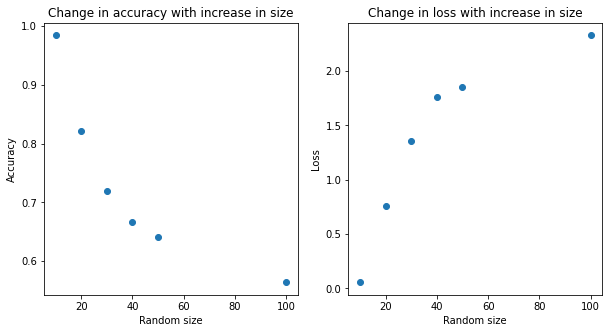

In [208]:
# Plot
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].set_title('Change in accuracy with increase in size')
ax[0].set_xlabel('Random size')
ax[0].set_ylabel('Accuracy')
ax[0].scatter(sizes, accs)

ax[1].set_title('Change in loss with increase in size')
ax[1].set_xlabel('Random size')
ax[1].set_ylabel('Loss')
ax[1].scatter(sizes, losses)

Clear that increasing the length of the random part of the sequence has a drastic efect on the success of the classifier, as we see exponential performance drop-off to as low as almost 50% accuracy. This is baseline we would get from randomly assigning a class to each item, or even just saying positive for every example.

This is presumably because the sequence becomes too long for the RNN to remember what it has seen before.

## Question B.4: Better models

Remember what we learned about vanilla RNN's ability to remember information over long time range. Pick a different RNN cell type that should have better ability to remember, and define a new network that uses this cell type. 
* Modify the function below to define an improved RNN classifier
* train an instance of this better RNN model on the same data we trained the previous classifier on
* repeat the analysis from Question 3 using your new model, and contrast your new architecture's performance with the vanilla RNN from before.

*15 marks*

### Answers B.4

Please edit the code below and add as many code cells as you would like to complete this task.

In [209]:
class extract_last_cell1(nn.Module):
  '''Pytorch module which extracts and flattens the last hidden state of an RNN.
  '''
  def forward(self,x):
    _, out = x
    return out.permute(1,0,2).flatten(start_dim=1)

def get_better_RNN_classifier():
  '''A better RNN architecture for solving the signature detection problem.
  '''
  return nn.Sequential(
    nn.GRU(input_size=1, hidden_size=20, num_layers=2, batch_first=True),
    extract_last_cell1(),
    nn.Linear(in_features = 20*2, out_features=1)
  )

In [210]:
accs1 = []
losses1 = []

classifier, accuracy, bce = fit_model(get_better_RNN_classifier(), ds_train, ds_test, lr=0.001, bs=int(10), opt='adam', epochs=5)

for size in sizes:
    ds_test = get_binary_dataset(1000, signature_length=10, random_length=size)
    print("Random length: ", size)
    output, accuracy, bce = run_model(classifier, ds_test)
    accs1.append(accuracy)
    losses1.append(bce)
    print("Accuracy: ", accuracy," Loss: ", bce)

Training Results - Epoch: 5  Avg accuracy: 1.00 Avg loss: 0.02
Validation Results - Epoch: 5  Avg accuracy: 0.61 Avg loss: 2.58

Random length:  10
Accuracy:  0.989  Loss:  0.049082130432128904
Random length:  20
Accuracy:  0.987  Loss:  0.05591714096069336
Random length:  30
Accuracy:  0.895  Loss:  0.39448809814453123
Random length:  40
Accuracy:  0.798  Loss:  1.066445556640625
Random length:  50
Accuracy:  0.735  Loss:  1.5004373779296876
Random length:  100
Accuracy:  0.606  Loss:  2.534057373046875


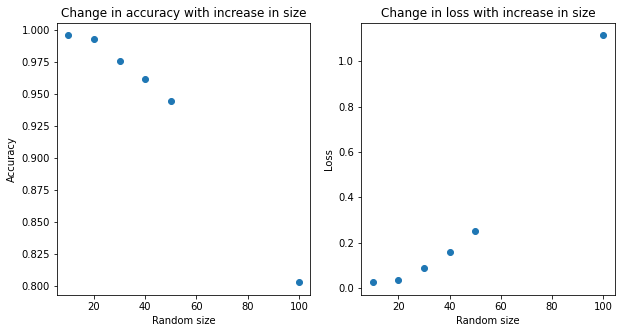

In [161]:
# Plot
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].set_title('Change in accuracy with increase in size')
ax[0].set_xlabel('Random size')
ax[0].set_ylabel('Accuracy')
ax[0].scatter(sizes, accs1)

ax[1].set_title('Change in loss with increase in size')
ax[1].set_xlabel('Random size')
ax[1].set_ylabel('Loss')
ax[1].scatter(sizes, losses1)

Much better performance than the vanilla classifier, but stil see a gradual decrease in performance for larger random sizes.  The lowest accuracy of ~80% for random size 100 is far better than the ~50% we had before. 

## Question B.5: Visualise memorization

Now we are going to visualize which parts of the input the trained architecture pays attention to when making its decision. This is going to be similar in spirit to [this distill post](https://distill.pub/2019/memorization-in-rnns/).
* take your pre-trained RNN classifier from the previous example
* generate a random positive input sequence (one that has a signature of length $10$ in it) and form an input tensor to the model.
* calculate the gradient of the model's output with respect to the input.

*Tips:*
* remember how we used `requires_grad` and `backward` and the `grad` attribute in the lecture to calculate the gradients of an RNN's hidden state with respect to the input sequence.
* remember the `TensorDataset` has a `tensors` argument which you can use to extract the input and output tensors from the dataset.

*15 marks*

### Answers B.5

Please add your solution to the code blocks below.

Text(0.5, 0, 'Index')

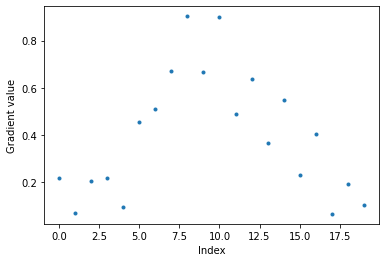

In [219]:
signature_length = 10
random_length = 10

input = get_binary_dataset(1, signature_length=signature_length, random_length=random_length)# Generate positive input

loader = DataLoader(input)
for X,Y in loader:
    X.requires_grad = True
    output = classifier(X)
    output.backward()
    xs = np.abs(X.grad[0,:,:].detach().numpy())
    plt.plot(xs, '.')
plt.ylabel('Gradient value')
plt.xlabel('Index')


This has quite random results when rerunning, so will take an average over many runs:

Text(0.5, 0, 'Index')

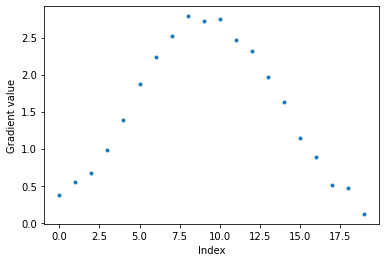

In [220]:
xs_tot = np.zeros_like(xs)

for i in range(0,50):
    input = get_binary_dataset(1, signature_length=signature_length, random_length=random_length)# Generate positive input
    loader = DataLoader(input)

    for X,Y in loader:
        X.requires_grad = True
        output = classifier(X)
        output.backward()
        xs = np.abs(X.grad[0,:,:].detach().numpy())
        xs_tot += xs

plt.plot(xs_tot/50, '.')
plt.ylabel('Gradient value')
plt.xlabel('Index')

Shows that on average, the central datapoints are the most important features. This makes sense, as they are the most likely to be in the signature each time.

## C Mini-Projects

Please **choose one** of the proposed mini-project questions below. Add as many text and code cells under the heading as you'd like. You may attempt more than one, but we will only mark one: please write below which mini-project you'd like to get marked on:

**I would like my solution for mini-project C.1 to be marked.**

## C.1: Adversarial examples for ResNets

Adversarial examples for image classifiers are images which have been imperceptibly changed such that the classifier's output changes. For example, below we see an image of a panda, which the network correctly classifies as panda (left), but when we add a small amount of structured noise (middle), and feed the modified image (right) into the classifier, it now classifies it is a gibbon with high confidence.

![](https://openai.com/content/images/2017/02/adversarial_img_1.png)

In this mini-project, your task is to generate an adversarial examples for a pretrained convolutional neural network of your choice (VGG19, ResNet18 or ResNet50 are good choices). Use the image of Blas as a starting point. Change the image of Blas imperceptibly so that your network misclassifies him as a bus or sea slug, or any other arbitrary ImageNet class which is clearly not a dog. I recommend using the *fast gradient sign* method described on page 3 of [(Szegedy et al, 2013)](https://arxiv.org/pdf/1412.6572.pdf). *(40 marks)*

For full marks, explore the topic a bit more, example questions you can ask:
* Can you deliberately control what class you get after the adversarial attack? *(~20 marks)*
* Does the adversarial example generated for one network fool other networks, too? *(~20 marks for non-minimal investigation and good writeup)*
* Load another image. Does the adversarial noise generated for one image work to fool the network when added to a different image *(~20 marks for for non-minimal investigation and good writeup)*
* Can you generate adversarial examples without access to gradients, only using the forward pass of the network (this is called black-box adversarial attack)? *(~40 marks)*

*Tips:*
* The *fast gradient sign* method relies on gradients of the network's output with respect to pixel values in image space: you are looking for the smallest change to pixel values which maximally change the classifier's outputs. Remember how we did this using `requires_gradients` and `backward` in the RNN example.
* To illustrate the change is imperceptible, you want to apply the change to the untransformed image, i.e. before the normalisation is applied. The normalization is itself differentiable, so my advice is to make the normalization part of the network itself.

*80 marks*

In [6]:
# imports to avoid running the whole notebook again
import numpy as np 
import torch
import requests
import json
from torch.nn.functional import softmax
from torchvision import models
from PIL import Image
from matplotlib import pylab as plt
from torchvision import transforms

imagenet_labels_url = 'https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json'
response = requests.get(imagenet_labels_url)
imagenet_class_names = json.loads(response.text)

def top_5_classes(y, class_names = None):
  if class_names==None:
    imagenet_labels_url = 'https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json'
    response = requests.get(imagenet_labels_url)
    class_names = json.loads(response.text)
  p = softmax(y[0,:], dim=0)
  values, indices = p.topk(5)
  return [(class_names[index], value) for index, value in zip(indices.detach().numpy(), values.detach().numpy())]

[('Cardigan Welsh Corgi', 0.1704209), ('Staffordshire Bull Terrier', 0.1703663), ('American Staffordshire Terrier', 0.12681296), ('Great Dane', 0.105531946), ('Basenji', 0.09078087)]


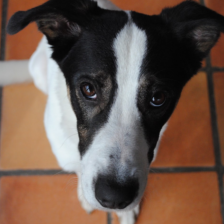

In [8]:
# Image and model from A

img = Image.open('blas_the_dog/test/blas.jpg')

crop = transforms.Compose([transforms.Resize(255),
                                transforms.CenterCrop(224),
                                transforms.ToTensor(),
                                ]) # moved normalisation
normalise = transforms.Compose([transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

cropped = crop(img)


# Model
resnet18 = models.resnet18(pretrained=True)

normal = normalise(cropped)

resnet18.eval()
y = resnet18(normal.unsqueeze(0))
print(top_5_classes(y))

transforms.ToPILImage()(cropped)

As we can see, resnet initially guesses the wrong breed, but does guess dog.

### First trying with random noise to get a baseline

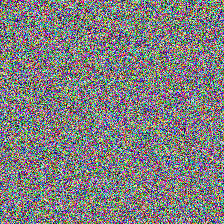

In [7]:
# Random noise 
noise =  torch.randn(cropped.size())*1 + 0
transforms.ToPILImage()(noise)

[('American Staffordshire Terrier', 0.25362253), ('Whippet', 0.24902984), ('Basenji', 0.14264975), ('Staffordshire Bull Terrier', 0.09975839), ('Italian Greyhound', 0.05686507)]


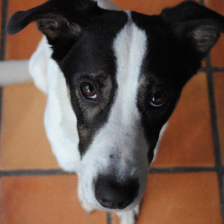

In [8]:
# Blas + noise
epsilon = 0.007
noisy = torch.clamp(cropped + epsilon * noise, 0, 1)
noisy_n = normalise(noisy)
x = noisy.unsqueeze(0)
resnet18.eval()
y = resnet18(x)
print(top_5_classes(y))

transforms.ToPILImage()(noisy)

At eps = 0.007 it doesn't do a great job at changing the prediction of dog.

In [48]:
def plot_prob_rank(epsilons, bc_probs, ranks):
    fig, ax = plt.subplots()
    axes = [ax, ax.twinx()]
    
    colors = ('Blue', 'Red')

    for ax, color in zip(axes, colors):
        if (color == 'Blue'):
            ax.plot(epsilons, bc_probs, color=color)
            ax.set_ylabel('Probability')
            ax.tick_params(axis='y', colors=color)
            data = epsilons*ranks
        else:
            ax.plot(epsilons, ranks, color=color)
            ax.tick_params(axis='y', colors=color)
            ax.set_ylabel('Rank')


    axes[0].set_xlabel('Epsilon')


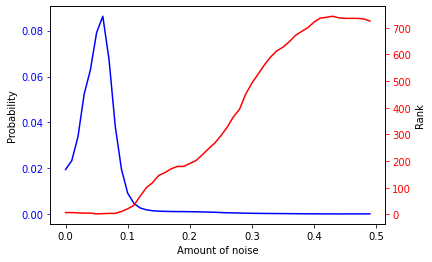

In [61]:
epsilons = np.arange(0, 0.5, 0.01)
bc_probs = []
ranks = []
for eps in epsilons:
    
    noisy = torch.clamp(cropped + eps * noise, 0, 1)
    noisy_n = normalise(noisy)
    x = noisy.unsqueeze(0)
    resnet18.eval()
    y = resnet18(x)

    p = softmax(y[0,:], dim=0)
    bc = p[232].detach()
    bc_probs.append(bc)
    
    temp = torch.argsort(p, descending = True)
    p_ranks = torch.argsort(temp)

    ranks.append(p_ranks[232])
    
plot_prob_rank(epsilons,bc_probs,ranks)

A plot of the probability and rank of the Border Collie class against the amount of noise added (eps) to show us  how the noise affects the probability of Border Collie in relation to how it affects other classes.

What we see with random noise is that, although some noise can increase the probability significantly, it is likely doing this for many classes, as the rank doesn't increase. We generally see that, past a certain threshold, an increase in noise leads to a fairly steady decrease in rank for the correct class.

### Implementing FGSM

In [62]:
def fgs(image, label, loss_fn, model, eps):

    cropped = crop(image)
    norm = normalise(cropped)

    norm.requires_grad = True
    model.eval()
    loss = loss_fn(model(norm.unsqueeze(0)), Y)
    loss.backward()

    noise = eps*norm.grad.sign()

    return noise


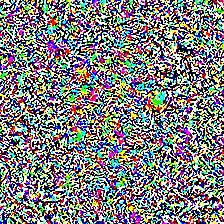

In [16]:
resnet18 = models.resnet18(pretrained=True)

Y = torch.tensor([232])
loss_fn = torch.nn.functional.nll_loss
model = models.resnet18(pretrained=True)

perturbation = fgs(img, Y, loss_fn, model, 0.007)

transforms.ToPILImage()(perturbation.squeeze(0))

[('Great Dane', 0.1538627), ('American Staffordshire Terrier', 0.1040056), ('Boston Terrier', 0.0710772), ('Staffordshire Bull Terrier', 0.06740649), ('Mexican hairless dog', 0.06313037)]


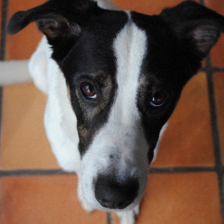

In [271]:
perturbed = torch.clamp(cropped + perturbation, 0, 1)

p_norm = normalise(perturbed)

model.eval()
out = model(p_norm.unsqueeze(0))

print(top_5_classes(out))

transforms.ToPILImage()(perturbed.squeeze(0))


Able to make the network misclassify the breed, but not make it think it is not a dog (with this amount of noise)

[('doormat', 0.0650571), ('Boston Terrier', 0.050093025), ('cardigan', 0.03599106), ('sock', 0.03554637), ('bath towel', 0.035463326)]


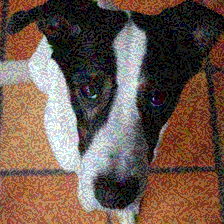

In [263]:
perturbation = fgs(img, Y, loss_fn, model, 0.09)
perturbed = torch.clamp(cropped + perturbation, 0, 1)

p_norm = normalise(perturbed)

model.eval()
out = model(p_norm.unsqueeze(0))

print(top_5_classes(out))

transforms.ToPILImage()(perturbed.squeeze(0))


Noise is now quite perceptible, but this was the smallest value for epsilon that I could get it to classify Blas as something other than a dog.

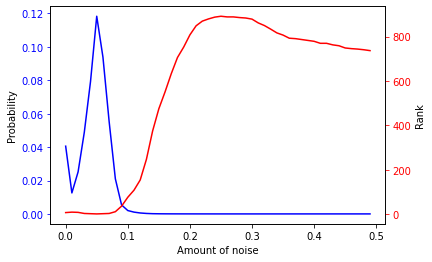

In [63]:
epsilons = epsilons = np.arange(0, 0.5, 0.01)
bc_probs = []
ranks = []
for eps in epsilons:
    
    perturbation = fgs(img, Y, loss_fn, model, eps)
    perturbed = torch.clamp((cropped + perturbation), 0, 1) # clamp to maintain range 

    p_norm = normalise(perturbed)
    y = resnet18(p_norm.unsqueeze(0))

    p = softmax(y[0,:], dim=0)
    bc = p[232].detach()
    bc_probs.append(bc)
    
    temp = torch.argsort(p, descending = True)
    p_ranks = torch.argsort(temp)

    ranks.append(p_ranks[232])

plot_prob_rank(epsilons,bc_probs,ranks)

This graph shows that, even though we were not able to create an adverserial that was as effective as that in the paper, we have lowered the noise threshold at which the rank begins climb, and the rate at which it does so.


To prove my implementation of fgsm works as well as the paper on other images, here's a demonstration of the panda result:


[('giant panda', 0.67724097), ('indri', 0.28043124), ('gibbon', 0.022719556), ('ring-tailed lemur', 0.0046524163), ('three-toed sloth', 0.0033559222)]


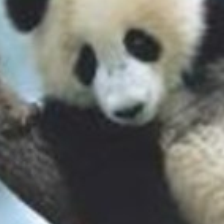

In [122]:

imagenet_labels_url = 'https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json'
response = requests.get(imagenet_labels_url)
class_names = json.loads(response.text)
panda = class_names.index('giant panda')
Yp = torch.tensor([panda])

model = models.resnet18(pretrained=True)
model.eval()

img = Image.open('blas_the_dog/test/panda.jpg')

img_t4 = crop(img)
img_n4 = normalise(img_t4)

y = model(img_n4.unsqueeze(0))
print(top_5_classes(y))
transforms.ToPILImage()(img_t4.squeeze(0))

[('gibbon', 0.17940351), ('koala', 0.1689363), ('langur', 0.1451372), ('titi', 0.08019711), ('common squirrel monkey', 0.04364797)]


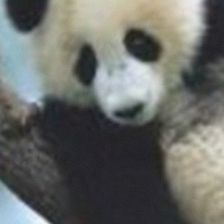

In [47]:

perturbation = fgs(img, Yp, loss_fn, model, 0.007)

perturbed = torch.clamp(img_t4 + perturbation, 0, 1)

p_norm = normalise(perturbed)


out = model(p_norm.unsqueeze(0))

print(top_5_classes(out))
transforms.ToPILImage()((perturbed).squeeze(0))

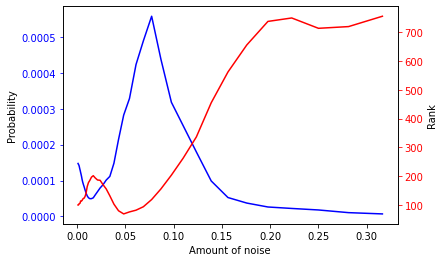

In [64]:
#epsilons = np.arange(0, 0.3, 0.001)
epsilons = np.logspace(-3, -0.5, 50)
bc_probs = []
ranks = []
for eps in epsilons:
    
    perturbation = fgs(img, Yp, loss_fn, model, eps)
    perturbed = torch.clamp((cropped + perturbation), 0, 1) # clamp to maintain range 

    p_norm = normalise(perturbed)
    y = resnet18(p_norm.unsqueeze(0))

    p = softmax(y[0,:], dim=0)
    bc = p[338].detach()
    bc_probs.append(bc)
    
    temp = torch.argsort(p, descending = True)
    p_ranks = torch.argsort(temp)

    ranks.append(p_ranks[338])

plot_prob_rank(epsilons,bc_probs,ranks)

Again shows that we were able to make the noise have a drastic effect on rank with less noise (note different epsilon scale)

### Trying same noise on different models

Continuing with the panda example

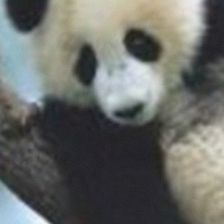

In [30]:
# Preparing input

perturbation = fgs(img, Yp, loss_fn, model, 0.007)
perturbed = torch.clamp(img_t4 + perturbation, 0, 1)
p_norm = normalise(perturbed)

transforms.ToPILImage()(perturbed.squeeze(0))

In [31]:
# On larger resnets:
resnet50 = models.resnet50(pretrained=True)
resnet50.eval()
y = resnet50(p_norm.unsqueeze(0))
print(top_5_classes(y))

resnet101 = models.resnet101(pretrained=True)
resnet101.eval()
y = resnet101(p_norm.unsqueeze(0))
print(top_5_classes(y))

resnet152 = models.resnet152(pretrained=True)
resnet152.eval()
y = resnet152(p_norm.unsqueeze(0))
print(top_5_classes(y))

resnet34 = models.resnet34(pretrained=True)
resnet34.eval()
y = resnet34(p_norm.unsqueeze(0))
print(top_5_classes(y))

[('giant panda', 0.9910347), ('teddy bear', 0.004211479), ('indri', 0.0014415047), ('red panda', 0.00092966575), ('black-and-white colobus', 0.0003761283)]
[('giant panda', 0.92614794), ('gibbon', 0.03823796), ('indri', 0.0144386105), ('red panda', 0.0071522812), ('ring-tailed lemur', 0.002864904)]
[('giant panda', 0.9822698), ('red panda', 0.008908528), ('indri', 0.0023794312), ('gibbon', 0.0015009332), ('teddy bear', 0.001196152)]
[('giant panda', 0.92507887), ('gibbon', 0.053585302), ('indri', 0.010704455), ('teddy bear', 0.0017478726), ('langur', 0.0013667678)]


In [32]:
# Wider resnet:
wide_resnet1 = models.wide_resnet101_2(pretrained=True)
wide_resnet1.eval()
y = wide_resnet1(p_norm.unsqueeze(0))
print(top_5_classes(y))

wide_resnet2 = models.wide_resnet50_2(pretrained=True)
wide_resnet2.eval()
y = wide_resnet2(p_norm.unsqueeze(0))
print(top_5_classes(y))

[('giant panda', 0.9913306), ('red panda', 0.003976628), ('gibbon', 0.0014800131), ('teddy bear', 0.0009655552), ('indri', 0.00041601423)]
[('giant panda', 0.979487), ('red panda', 0.007135596), ('indri', 0.0018548005), ('koala', 0.0012592709), ('teddy bear', 0.0012289913)]


In [33]:
# Others
alexnet = models.alexnet(pretrained=True)
alexnet.eval()
y = alexnet(p_norm.unsqueeze(0))
print(top_5_classes(y))

mobile = models.mobilenet_v2(pretrained=True)
mobile.eval()
y = mobile(p_norm.unsqueeze(0))
print(top_5_classes(y))

[('giant panda', 0.3810535), ('indri', 0.18122642), ('red panda', 0.06457829), ('titi', 0.030222077), ('ring-tailed lemur', 0.026757205)]
[('giant panda', 0.9964993), ('red panda', 0.0011944296), ('gibbon', 0.00035498946), ('Pomeranian', 0.0003369696), ('Toy Poodle', 0.00017378524)]


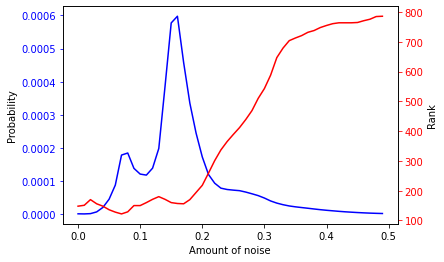

In [68]:
# Plotting mobilenet:
epsilons = np.arange(0, 0.5, 0.01)
bc_probs = []
ranks = []

for eps in epsilons:
    perturbation = fgs(img, Yp, loss_fn, model, eps)
    perturbed = torch.clamp(img_t2 + perturbation, 0, 1)
    p_norm = normalise(perturbed)

    mobile.eval()
    out = mobile(p_norm.unsqueeze(0))

    p = softmax(out[0,:], dim=0)
    bc = p[232].detach()
    bc_probs.append(bc)
    
    temp = torch.argsort(p, descending = True)
    p_ranks = torch.argsort(temp)

    ranks.append(p_ranks[232])

plot_prob_rank(epsilons,bc_probs,ranks)

All resist this specific noise better than the network that it was trained on. This is perhaps unsurprising, since we used the gradients calculated in the resnet18 to create the noise. While it is possible that similar pixels/shapes are important in classifying the panda, it is unlikely that the same values would be produced consistently.

The graph for mobilenet is very similar to that of the random noise on the resnet, suggesting no improvement by using FGSM. 

### On different images
Firstly, lets try another panda

[('gibbon', 0.7726508), ('indri', 0.10490922), ('giant panda', 0.09610517), ('white-headed capuchin', 0.005386456), ('howler monkey', 0.0035546217)]


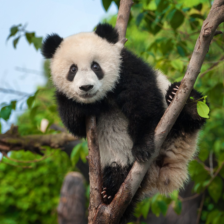

In [34]:
img2 = Image.open('blas_the_dog/test/panda2.jpg')
img_t2 = crop(img2)
img_n2 = normalise(img_t2)
x = img_n2.unsqueeze(0)

resnet18 = models.resnet18(pretrained=True)
resnet18.eval()

y = resnet18(x)
print(top_5_classes(y))
transforms.ToPILImage()(img_t2)

This time it has already misclassified it as a gibbon, with panda in third.

[('gibbon', 0.71142584), ('indri', 0.15297528), ('giant panda', 0.10290058), ('white-headed capuchin', 0.0068591256), ('ring-tailed lemur', 0.006081759)]


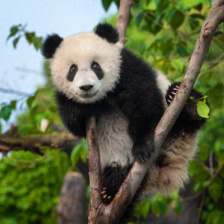

In [38]:
perturbation = fgs(img, Yp, loss_fn, model, 0.007)
perturbed = torch.clamp(img_t2 + perturbation, 0, 1)
p_norm = normalise(perturbed)

model.eval()
out = model(p_norm.unsqueeze(0))

print(top_5_classes(out))

transforms.ToPILImage()(perturbed.squeeze(0))

Peturbation has not had any significant effect on the classes, with all sitting at similar probabilities and similar ranks.

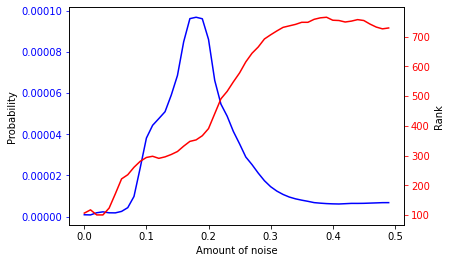

In [65]:
epsilons = np.arange(0, 0.5, 0.01)
bc_probs = []
ranks = []
for eps in epsilons:
    perturbation = fgs(img, Yp, loss_fn, model, eps)
    perturbed = torch.clamp(img_t2 + perturbation, 0, 1)
    p_norm = normalise(perturbed)

    model.eval()
    out = model(p_norm.unsqueeze(0))

    p = softmax(out[0,:], dim=0)
    bc = p[232].detach()
    bc_probs.append(bc)
    
    temp = torch.argsort(p, descending = True)
    p_ranks = torch.argsort(temp)

    ranks.append(p_ranks[232])

plot_prob_rank(epsilons,bc_probs,ranks)

This is worse than for our original panda, but slightly better than random noise performs, as the threshold is lower and the rate of rank increase is higher.

#### Entirely different image:


[('banana', 0.97667557), ('zucchini', 0.0059383563), ('orange', 0.0034038923), ('acorn squash', 0.002710656), ('lemon', 0.0024241065)]


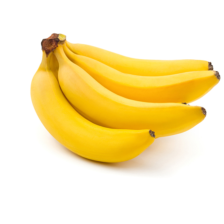

In [40]:
img3 = Image.open('blas_the_dog/test/definitely_not_blas.jpg')
img_t3 = crop(img3)
img_n3 = normalise(img_t3)

resnet18 = models.resnet18(pretrained=True)
resnet18.eval()
y = resnet18(img_n3.unsqueeze(0))
print(top_5_classes(y))

transforms.ToPILImage()(img_t3)

The network is very easily able to determine this is not in fact a panda, but a banana.

[('banana', 0.9591794), ('orange', 0.01413737), ('lemon', 0.005550314), ('zucchini', 0.0054214103), ('acorn squash', 0.0028546194)]


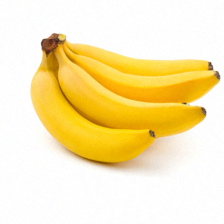

In [41]:
perturbation = fgs(img, Yp, loss_fn, model, 0.007)
perturbed = torch.clamp(img_t3 + perturbation, 0, 1)
p_norm = normalise(perturbed)

model.eval()
out = model(p_norm.unsqueeze(0))

print(top_5_classes(out))
transforms.ToPILImage()((perturbed).squeeze(0))

Adding the anti-panda noise does very little. The banana probability has shrunk slightly but is still miles ahead of any other class, thus the adverserial attack has failed.

In [43]:
imagenet_labels_url = 'https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json'
response = requests.get(imagenet_labels_url)
class_names = json.loads(response.text)
banana = class_names.index('banana')
banana

954

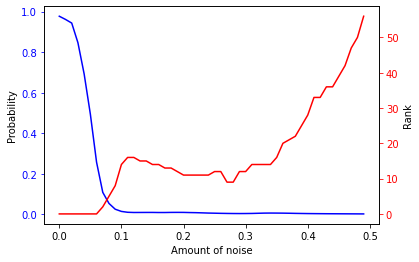

In [69]:
epsilons  = np.arange(0, 0.5, 0.01)
bc_probs = []
ranks = []
for eps in epsilons:
    perturbation = fgs(img, Yp, loss_fn, model, eps)
    perturbed = torch.clamp(img_t3 + perturbation, 0, 1)
    p_norm = normalise(perturbed)

    model.eval()
    out = model(p_norm.unsqueeze(0))

    p = softmax(out[0,:], dim=0)
    bc = p[banana].detach()
    bc_probs.append(bc)
    
    temp = torch.argsort(p, descending = True)
    p_ranks = torch.argsort(temp)

    ranks.append(p_ranks[banana])

plot_prob_rank(epsilons,bc_probs,ranks)

Suprisingly, it didn't take much too much noise to deter the network away from classifying banana. 

To get a sense of where the perceptible limit is, I will plot images of varying epsilon.

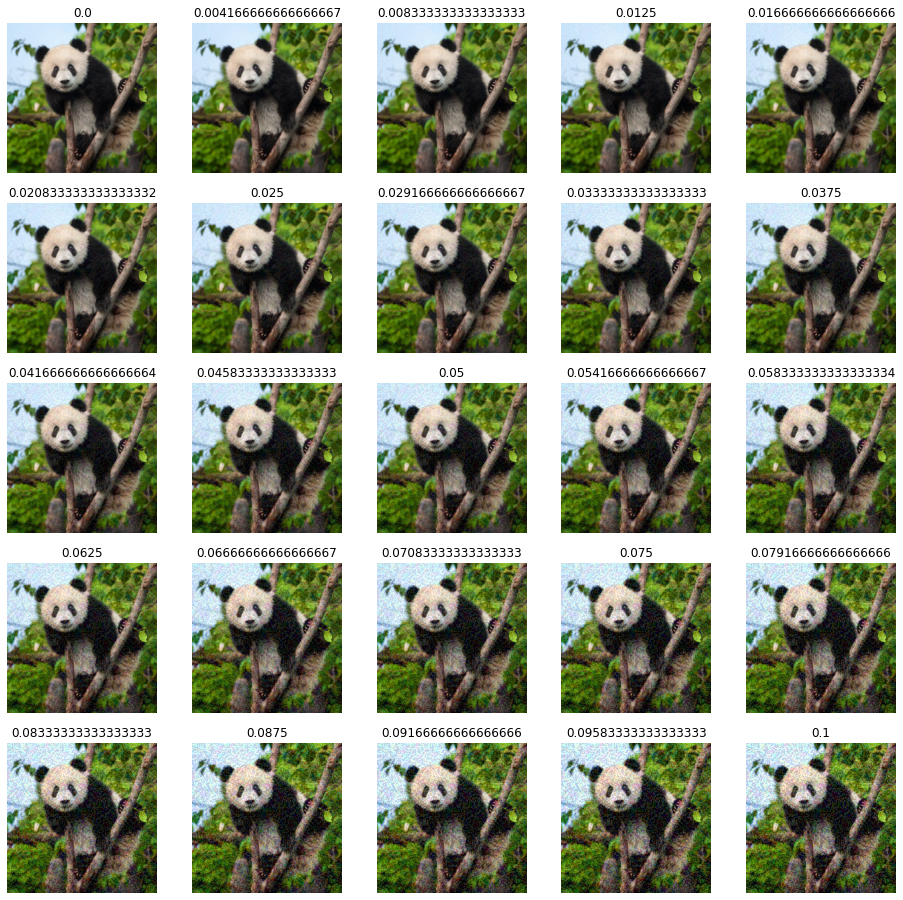

In [99]:
img2 = Image.open('blas_the_dog/test/panda2.jpg')
img_t2 = crop(img2)
f = plt.figure(figsize = (16,16))

j = 0
for i in  np.linspace(0, 0.1, 25):
    j+=1
    ax = plt.subplot(5, 5, j)
    perturbation = fgs(img, Yp, loss_fn, model, i)

    perturbed = torch.clamp(img_t2 + perturbation, 0, 1)
    image = transforms.ToPILImage()((perturbed).squeeze(0))
    ax.set_title(i)
    plt.imshow(image)
    plt.axis('off')

To my eye, the noise becomes visible around the 0.05 area, particularly in large areas areas of one colour like the sky. We can use this to judge how roughly imperceiptable our generated noise is. Obviously this will vary between different observers, images and noise functions. 

For example on the banana artefacts become visible on the banana from about 0.025, as it is a much plainer image:



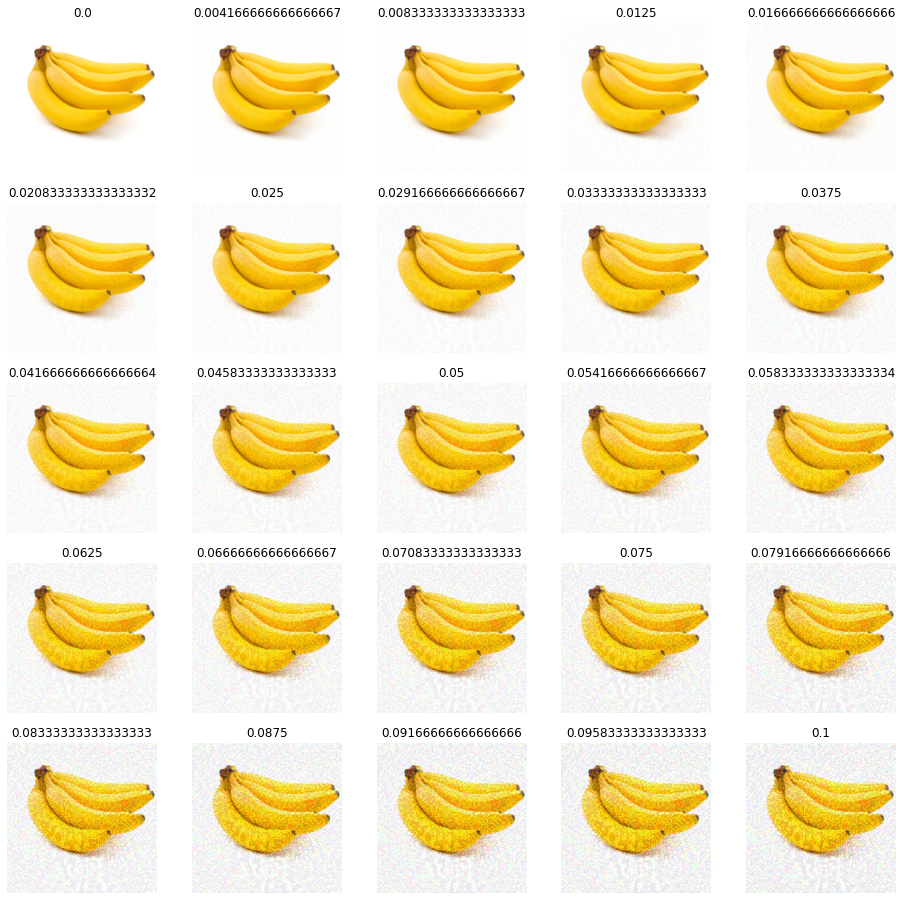

In [100]:
img_t3 = crop(img3)
f = plt.figure(figsize = (16,16))

j = 0
for i in  np.linspace(0, 0.1, 25):
    j+=1
    ax = plt.subplot(5, 5, j)
    perturbation = fgs(img, Yp, loss_fn, model, i)

    perturbed = torch.clamp(img_t3 + perturbation, 0, 1)
    image = transforms.ToPILImage()((perturbed).squeeze(0))
    ax.set_title(i)
    plt.imshow(image)
    plt.axis('off')

## Targeted attack

To perform a target adverserial attack, we need to adjust our peturbing function to find the minimum loss between the image and the target class.


In [120]:
def targeted_fgs(image, target, loss_fn, model, eps):

    cropped = crop(image)
    norm = normalise(cropped)

    norm.requires_grad = True
    model.eval()
    loss = loss_fn(model(norm.unsqueeze(0)), target)
    loss.backward()

    noise = -eps*norm.grad.sign() #changed to negative

    return noise


Trying to turn the panda into a custard apple (index 956):

[('custard apple', 0.9874724), ('giant panda', 0.007793178), ('teddy bear', 0.0024020604), ('Toy Poodle', 0.0003951592), ('soccer ball', 0.0002754576)]


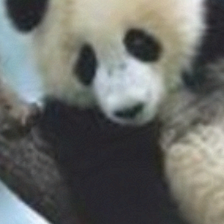

In [124]:

model = models.resnet18(pretrained=True)
model.eval()

img = Image.open('blas_the_dog/test/panda.jpg')

img_t = crop(img)
img_n = normalise(img_t)
loss_fn = torch.nn.functional.nll_loss
index = 956
target = torch.tensor([index])

perturbation = targeted_fgs(img, target, loss_fn, model, 0.007)

perturbed = torch.clamp(img_t + perturbation, 0, 1)

p_norm = normalise(perturbed)


out = model(p_norm.unsqueeze(0))

print(top_5_classes(out))

transforms.ToPILImage()((perturbed).squeeze(0))

That worked very well with little noise. Custard apple's probability was much higher than any other classes, though giant panda was still second.

To see its performance in general, I will run it on every class in imagenet:

In [173]:
%%time
tot = 0
tot1 = 0 

num = 100
for i in range (0,num):
    
    target = torch.tensor([i])
    name = class_names[i]
    perturbation = targeted_fgs(img, target, loss_fn, model, 0.007)

    perturbed = torch.clamp(img_t + perturbation, 0, 1)

    p_norm = normalise(perturbed)


    out = model(p_norm.unsqueeze(0))

    top5 = (top_5_classes(out))

    j = 0
    for c_name, prob in top5:
        if (c_name == name):
            if (j == 0):
                tot1 += 1
            tot += 1
        j += 1

print("Percentage of occurences in top 5 classes: ", tot*100/num, "%")
print("Percentage of occurences as top class: ", tot1*100/num, "%")


Percentage of occurences in top 5 classes:  61.0 %
Percentage of occurences as top class:  26.0 %
Wall time: 21.2 s


On average, it appears in the top 5 roughly 40% of the time. This isn't great, but we are using a very small amount of added noise.

Repeating for more noise:

In [181]:
%%time
tot = 0
tot1 = 0
img = Image.open('blas_the_dog/test/panda.jpg')

num = 100
for i in range (0,num):
    
    target = torch.tensor([i])
    name = class_names[i]
    perturbation = targeted_fgs(img, target, loss_fn, model, 0.02)

    perturbed = torch.clamp(img_t + perturbation, 0, 1)

    p_norm = normalise(perturbed)


    out = model(p_norm.unsqueeze(0))

    top5 = (top_5_classes(out))

    j = 0

    for c_name, prob in top5:
        if (c_name == name):
            if (j == 0):
                tot1 += 1
            tot += 1
        j += 1


print("Percentage of occurences in top 5 classes: ", tot*100/num, "%")
print("Percentage of occurences as top class: ", tot1*100/num, "%")


Percentage of occurences in top 5 classes:  20.0 %
Percentage of occurences as top class:  4.0 %
Wall time: 21.3 s


And less noise:

In [182]:
%%time
tot = 0
tot1 = 0
img = Image.open('blas_the_dog/test/panda.jpg')

num = 100
for i in range (0,num):
    
    target = torch.tensor([i])
    name = class_names[i]
    perturbation = targeted_fgs(img, target, loss_fn, model, 0.001)

    perturbed = torch.clamp(img_t + perturbation, 0, 1)

    p_norm = normalise(perturbed)


    out = model(p_norm.unsqueeze(0))

    top5 = (top_5_classes(out))

    j = 0

    for c_name, prob in top5:
        if (c_name == name):
            if (j == 0):
                tot1 += 1
            tot += 1
        j += 1


print("Percentage of occurences in top 5 classes: ", tot*100/num, "%")
print("Percentage of occurences as top class: ", tot1*100/num, "%")

Percentage of occurences in top 5 classes:  5.0 %
Percentage of occurences as top class:  0.0 %
Wall time: 21.5 s


Would've like to have done a plot of these percentages against epsilon, but these loops take a long time to run on my machine (20 secs for 100 examples)

What I found was that there appears to be a 'sweet spot' for epsilon which achieves the best results - too high and it would 'overshoot' the desired class, too low and it wouldn't get close enough.

As it happens, this spot is fairly close to 0.007, though is probably dependent on each image.

To improve my targeted attack, I apply it over a range of gradients for a specific class until it classifies it corrrectly:

In [209]:

flag = True
eps = 0.001
iters = 0
max_iters = 10

index = np.random.randint(0,1000)
name = class_names[index]
target = torch.tensor([index])

print(name)

while(flag):

   
    perturbation = targeted_fgs(img, target, loss_fn, model, eps)
    perturbed = torch.clamp(img_t + perturbation, 0, 1)
    p_norm = normalise(perturbed)
    out = model(p_norm.unsqueeze(0))

    top5 = (top_5_classes(out))
    j = 0
    for c_name, prob in top5:
        if (c_name == name):
            print("Top 5 class with epsilon: ", eps)
            flag = False
        elif (iters > max_iters):
                print("Not top 5 class in fewer than ", max_iters, " iterations")
                flag = False
                break
        else:
            eps = eps*2
            iters += 1
            break
            



American Staffordshire Terrier
Not top 5 class in fewer than  10  iterations


Unfortunately for most classes this didn't improve things much, and although I'd like to get an average score over many to compare, I am again limited by runtime.

Next I look at whether the targeted attack generalises to other images/networks better than untargeted did. I do this on a successful perturbation, the custard apple exmaple.


In [129]:
resnet50 = models.resnet50(pretrained=True)
resnet50.eval()
y = resnet50(p_norm.unsqueeze(0))
print(top_5_classes(y))


[('giant panda', 0.95224714), ('indri', 0.02926405), ('red panda', 0.00900127), ('gibbon', 0.0017831209), ('white-headed capuchin', 0.00090044894)]


Again, on a different model it is as good as useless. This is likely because the reasons I talk about above do not change when we are minimising the loss - the important features will be very different across different models.

[('gibbon', 0.67659914), ('indri', 0.15437938), ('giant panda', 0.13084775), ('white-headed capuchin', 0.007924432), ('ring-tailed lemur', 0.0063456795)]


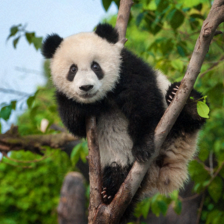

In [130]:
img = Image.open('blas_the_dog/test/panda2.jpg')
img_t = crop(img)
perturbed = torch.clamp(img_t + perturbation, 0, 1)

p_norm = normalise(perturbed)

y = model(p_norm.unsqueeze(0))
print(top_5_classes(y))

transforms.ToPILImage()((perturbed).squeeze(0))

Suprisingly, for the second panda image, the perturbation succeeded in changing the predicted class, but ultimately not to the desired one of custard apple. 

## Basic iterative method
An extension of the fast gradient sign method, since I wasn't satisfied with the original's performance on Blas.

This algorithm is outlined in this paper: https://arxiv.org/pdf/1607.02533.pdf

In [131]:
def basic_iterative(image, Y, loss_fn, model, eps= 0.007, iterations=5, alpha=1):

    i = 0
    cropped = crop(image)
    x = cropped.unsqueeze(0)
    x_adv = x.clone().detach()
    
    while (i < iterations): # The iterative part

        model.eval()
    
        x_adv.requires_grad = True
        loss = loss_fn(model(x_adv), Y)
        loss.backward()

        # Key difference from straight fgs: step in direction of the sign of the gradient
        x_adv.data = x_adv + alpha*torch.sign(x_adv.grad)   
    
        # Clip
        x_adv.data = torch.min(x_adv, x+eps)
        x_adv.data = torch.max(x_adv, x-eps)
    
        # Clamp as before to bring into image range
        x_adv.data = torch.clamp(x_adv, min=0, max=1)
        i+=1

    return x_adv


[('Boston Terrier', 0.5286679), ('Mexican hairless dog', 0.13643408), ('Italian Greyhound', 0.05958227), ('Great Dane', 0.043993965), ('Staffordshire Bull Terrier', 0.031977974)]


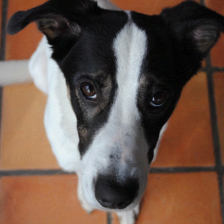

In [41]:
img = Image.open('blas_the_dog/test/blas.jpg')
loss = torch.nn.functional.nll_loss
model = models.resnet18(pretrained=True)
Y = torch.tensor([232])
adv = basic_iterative(img, Y, loss, model, alpha=1, eps=0.007, iterations=10)

adv_n = normalise(adv.unsqueeze(0))
model.eval()
out = model(adv_n.squeeze(0))

print(top_5_classes(out))

transforms.ToPILImage()(adv.squeeze(0))

Successfully throws off the breed again. Let's see if we can do more by changing the paramaters. 

[('mask', 0.20897101), ('mortar', 0.19730033), ('dromedary', 0.13069479), ('chain mail', 0.12181502), ('pitcher', 0.076280065)]


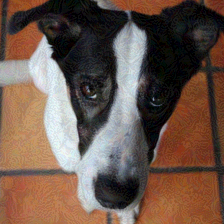

In [45]:
adv = basic_iterative(img, Y, loss, model, alpha=0.007, eps=0.03, iterations=20)

adv_n = normalise(adv.unsqueeze(0))
model.eval()
out = model(adv_n.squeeze(0))

print(top_5_classes(out))

transforms.ToPILImage()(adv.squeeze(0))

Much better result! Blas is successfully classified as a mask, with no dogs in the top 5 classes.

Let's investigate the effect of each parameter:

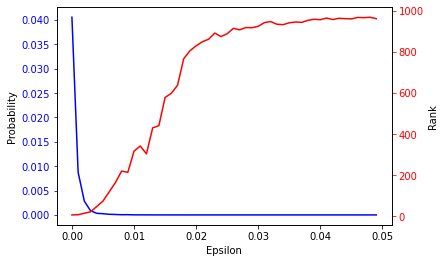

In [50]:
epsilons  = np.arange(0, 0.05, 0.001)
bc_probs = []
ranks = []

for eps in epsilons:

    adv = basic_iterative(img, Y, loss, model, alpha=0.007, eps=eps, iterations=10)

    adv_n = normalise(adv.unsqueeze(0))
    model.eval()
    out = model(adv_n.squeeze(0))

    p = softmax(out[0,:], dim=0)
    bc = p[232].detach()
    bc_probs.append(bc)
    
    temp = torch.argsort(p, descending = True)
    p_ranks = torch.argsort(temp)

    ranks.append(p_ranks[232])

plot_prob_rank(epsilons,bc_probs,ranks)

In [68]:
alphas  = np.arange(0, 0.01, 0.001)
bc_probs = []
ranks = []

for a in alphas:

    adv = basic_iterative(img, Y, loss, model, alpha=a, eps=0.03, iterations=10)

    adv_n = normalise(adv.unsqueeze(0))
    model.eval()
    out = model(adv_n.squeeze(0))

    p = softmax(out[0,:], dim=0)
    bc = p[232].detach()
    bc_probs.append(bc)
    temp = torch.argsort(p, descending = True)
    p_ranks = torch.argsort(temp)

    ranks.append(p_ranks[232])



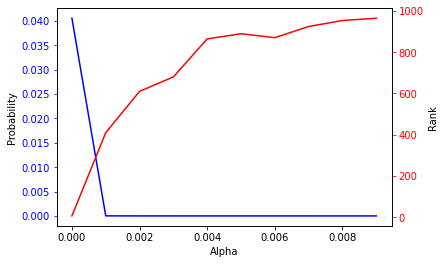

In [72]:
def plot_prob_rank1(epsilons, bc_probs, ranks, label):
    fig, ax = plt.subplots()
    axes = [ax, ax.twinx()]
    
    colors = ('Blue', 'Red')

    for ax, color in zip(axes, colors):
        if (color == 'Blue'):
            ax.plot(epsilons, bc_probs, color=color)
            ax.set_ylabel('Probability')
            ax.tick_params(axis='y', colors=color)
            data = epsilons*ranks
        else:
            ax.plot(epsilons, ranks, color=color)
            ax.tick_params(axis='y', colors=color)
            ax.set_ylabel('Rank')


    axes[0].set_xlabel(label)

plot_prob_rank1(alphas, bc_probs,ranks, 'Alpha')


In [73]:
iters  = np.arange(1, 10)
bc_probs = []
ranks = []

for i in iters:

    adv = basic_iterative(img, Y, loss, model, alpha=0.007, eps=0.03, iterations=i)

    adv_n = normalise(adv.unsqueeze(0))
    model.eval()
    out = model(adv_n.squeeze(0))

    p = softmax(out[0,:], dim=0)
    bc = p[232].detach()
    bc_probs.append(bc)
    
    temp = torch.argsort(p, descending = True)
    p_ranks = torch.argsort(temp)

    ranks.append(p_ranks[232])

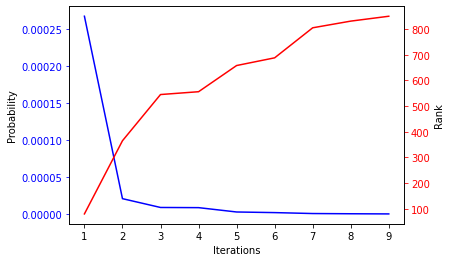

In [75]:
plot_prob_rank1(iters, bc_probs,ranks,'Iterations')

I would've like to have done grid-search type approach here, but I am again limited by the runtime, so had to look at each parameter individually. 

We see that it takes very small values of alpha and epsilon to disrupt the probability massively (0.001 in each case). Since we have such good performance with these parameters, we don't need that many iterations to disrupt the final classification. 

It's hard to compare these results directly to the original algorithm, since we the parameters now have differne effects. This means we cannot simply say: BI performed better because it used a lower value of epsilon to disrupt the image than in FGS. However, just based on what I can see, the noise appears far less visible in this example.

I then decided to repeat the analysis of different models/images with the same noise with this algorithm.

I use an adversarial generated with the following parameters:

[('mask', 0.20897101), ('mortar', 0.19730033), ('dromedary', 0.13069479), ('chain mail', 0.12181502), ('pitcher', 0.076280065)]


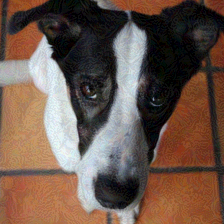

In [103]:
adv = basic_iterative(img, Y, loss, model, alpha=0.007, eps=0.03, iterations=20)

adv_n = normalise(adv.unsqueeze(0))
model.eval()
out = model(adv_n.squeeze(0))

print(top_5_classes(out))

transforms.ToPILImage()(adv.squeeze(0))

### Different models

In [77]:
# On larger resnets:
resnet50 = models.resnet50(pretrained=True)
resnet50.eval()
y = resnet50(adv_n.squeeze(0))
print(top_5_classes(y))

resnet101 = models.resnet101(pretrained=True)
resnet101.eval()
y = resnet101(adv_n.squeeze(0))
print(top_5_classes(y))

resnet152 = models.resnet152(pretrained=True)
resnet152.eval()
y = resnet152(adv_n.squeeze(0))
print(top_5_classes(y))

resnet34 = models.resnet34(pretrained=True)
resnet34.eval()
y = resnet34(adv_n.squeeze(0))
print(top_5_classes(y))

[('Boston Terrier', 0.38561657), ('bath towel', 0.117124885), ('Cardigan Welsh Corgi', 0.049524296), ('Basenji', 0.0449935), ('mop', 0.03839839)]
[('Boston Terrier', 0.74940383), ('toy terrier', 0.061857138), ('Chihuahua', 0.029347032), ('Beagle', 0.019826882), ('Cardigan Welsh Corgi', 0.016993914)]
[('Basenji', 0.34081408), ('American Staffordshire Terrier', 0.25340876), ('Boston Terrier', 0.17296688), ('Staffordshire Bull Terrier', 0.12583514), ('Bluetick Coonhound', 0.015391882)]
[('American Staffordshire Terrier', 0.37423497), ('Boston Terrier', 0.20661522), ('Boxer', 0.11261976), ('Staffordshire Bull Terrier', 0.082820736), ('Great Dane', 0.030879095)]


In [79]:
# Wider resnet:
wide_resnet1 = models.wide_resnet101_2(pretrained=True)
wide_resnet1.eval()
y = wide_resnet1(adv_n.squeeze(0))
print(top_5_classes(y))

wide_resnet2 = models.wide_resnet50_2(pretrained=True)
wide_resnet2.eval()
y = wide_resnet2(adv_n.squeeze(0))
print(top_5_classes(y))

[('American Staffordshire Terrier', 0.2954878), ('Staffordshire Bull Terrier', 0.25191775), ('Basenji', 0.14648199), ('Boston Terrier', 0.10324652), ('Boxer', 0.05147816)]
[('Boston Terrier', 0.7229054), ('Bluetick Coonhound', 0.03437552), ('Basenji', 0.032204792), ('Boxer', 0.029627671), ('American Staffordshire Terrier', 0.02746634)]


In [80]:
# Others
alexnet = models.alexnet(pretrained=True)
alexnet.eval()
y = alexnet(adv_n.squeeze(0))
print(top_5_classes(y))

mobile = models.mobilenet_v2(pretrained=True)
mobile.eval()
y = mobile(adv_n.squeeze(0))
print(top_5_classes(y))

[('Whippet', 0.37058306), ('Basenji', 0.17997313), ('Boston Terrier', 0.12778302), ('Italian Greyhound', 0.10643234), ('toy terrier', 0.087707885)]
[('Italian Greyhound', 0.361591), ('Whippet', 0.23762526), ('llama', 0.07466358), ('bath towel', 0.050907936), ('Mexican hairless dog', 0.036155533)]


Not able to fool these other models as successfully as the one it was trained on. It was able to throw off the breed in most cases, but not the fact that it was a dog, presumably for similar reasons to that which I discussed earlier.

## Changing the image

Because the noise was generated iteratively on the image of Blas to create the adverserial, there is no plain noise tensor I can just add to another image. To extract this, I get the difference between the original image of Blas and the altered one.


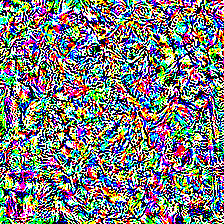

In [104]:
noise = crop(img) - adv
transforms.ToPILImage(noise.detach().squeeze(0))

transforms.ToPILImage()(noise.squeeze(0))

[('Border Collie', 0.85117066), ('Cardigan Welsh Corgi', 0.07810368), ('collie', 0.039750714), ('Appenzeller Sennenhund', 0.0061377133), ('Papillon', 0.005365804)]


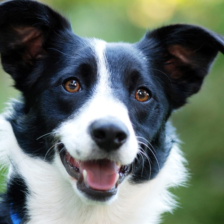

In [114]:
img6 = Image.open('blas_the_dog/test/not_blas.jpg')
img6_t = crop(img6)

out = model(normalise(img6_t).unsqueeze(0))

print(top_5_classes(out))
transforms.ToPILImage()(img6_t.squeeze(0))

Initially correctly classifies as another Border Collie

[('Cardigan Welsh Corgi', 0.5179243), ('Border Collie', 0.3448031), ('collie', 0.039150998), ('Australian Kelpie', 0.024545532), ('Appenzeller Sennenhund', 0.021376515)]


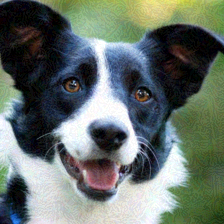

In [111]:
img6_noisy = torch.clamp(img6_t + noise, 0 , 1)

out = model(normalise(img6_noisy))

print(top_5_classes(out))
transforms.ToPILImage()(img6_noisy.squeeze(0))

Able to perturb the breed, but not as effectively as on the image it was trained on, Blas.

One issue I have realised with the images I have been using so far is that since they are from Google searches, it is quite likely they are in the ImageNet dataset and thus used in the training of some of these networks, meaning the network would likely be very confident about their labels.

In order to try something different, I use a picture of my dogs.

[('Basenji', 0.6715758), ('English foxhound', 0.09487618), ('Italian Greyhound', 0.085861824), ('Ibizan Hound', 0.029464548), ('Cardigan Welsh Corgi', 0.02317408)]


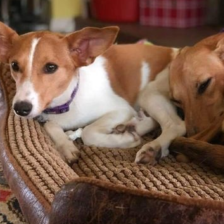

In [118]:
img7 = Image.open('blas_the_dog/test/dogs.jpg')
img7_t = crop(img7)

out = model(normalise(img7_t).unsqueeze(0))

print(top_5_classes(out))
transforms.ToPILImage()(img7_t.squeeze(0))

The correct breed of Saffy (left) is Podengo, but I don't expect this to be a label in ImageNet. Basenjis are fairly similar looking, so we'll take this as the truth value.

[('Basenji', 0.88967824), ('Italian Greyhound', 0.017889861), ('Wire Fox Terrier', 0.016054654), ('Cardigan Welsh Corgi', 0.011330601), ('dingo', 0.010525526)]


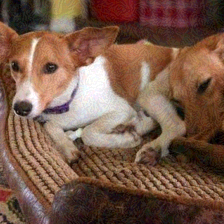

In [119]:
img7_noisy = torch.clamp(img7_t + noise, 0 , 1)

out = model(normalise(img7_noisy))

print(top_5_classes(out))
transforms.ToPILImage()(img7_noisy.squeeze(0))

As it turns out, using this new image didn't change much. In fact, it only made the network more confident of the Basenji class.

I believe suffices to say that the two algorithms which I tried, Fast Gradient Sign and Basic Iterative, do not produce noise that generalises to peturb any class in the untargeted case. 